In [3]:
import numpy as np
import kwant
import kwant.continuum
import pickle
import sympy
import BoundState as bs
import pandas as pd
from sympy.physics.matrices import msigma, Matrix
from sympy import eye
from sympy.physics.quantum import TensorProduct
import Functions as f
import matplotlib.pyplot as plt
import peierls
from sympy.utilities.exceptions import SymPyDeprecationWarning
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=SymPyDeprecationWarning)

def make_3dti(Lx=100,Wy=100,Tz=100,a=10,phase=np.pi,mu=0.02,flux=0,Delta=0.01,
             params_3DTI=dict(A_perp=3,A_z=3,M_0=0.3,M_perp=15,M_z=15,C_0=0,C_perp=0,C_z=0)):
    ham_3DTI = ("- mu * kron(sigma_z, sigma_0, sigma_0) + "
                "{epsilon} * kron(sigma_z, sigma_0, sigma_0) + "
                "{M} * kron(sigma_z, sigma_0, sigma_z) - "
                "A_perp * k_x * kron(sigma_z, sigma_y, sigma_x) + "
                "A_perp * k_y * kron(sigma_0, sigma_x, sigma_x) + "
                "A_z * k_z * kron(sigma_z, sigma_0, sigma_y)")

    epsilon = "(C_0 - C_perp * (k_x**2 + k_y**2) - C_z * k_z**2)"
    M = "(M_0 - M_perp * (k_x**2 + k_y**2) - M_z * k_z**2)"
    ham_3DTI = ham_3DTI.format(epsilon=epsilon, M=M)
    ham_3DTI = ham_3DTI.format(C_0="C_0")

    SC_complex = ("- re({Delta}) * kron(sigma_y, sigma_y, sigma_0) -"
                  "im({Delta}) * kron(sigma_x, sigma_y, sigma_0)")

    SC_L_final = SC_complex.format(Delta="Deltaf_L(y, z)")
    SC_R_final = SC_complex.format(Delta="Deltaf_R(y, z)")

    ham_3DTI_SC_L = ham_3DTI + SC_L_final # 3D TI BdG Hamiltonian with superconducting pairing potential for left lead
    ham_3DTI_SC_R = ham_3DTI + SC_R_final # 3D TI BdG Hamiltonian with superconducting pairing potential for right lead

    ham_3DTI_discr, coords = kwant.continuum.discretize_symbolic(ham_3DTI)
    ham_3DTI_SC_L_discr, coords = kwant.continuum.discretize_symbolic(ham_3DTI_SC_L)
    ham_3DTI_SC_R_discr, coords = kwant.continuum.discretize_symbolic(ham_3DTI_SC_R)

    vector_potential='[B_y * (z - T_z), -B_x * (z - T_z), 0]'
    signs=[-1, -1, -1, -1, 1, 1, 1, 1] # negative charge for the particles, positive charge for the holes

    ham_3DTI_discr = peierls.apply(ham_3DTI_discr, coords, A=vector_potential, signs=signs)
    ham_3DTI_SC_L_discr = peierls.apply(ham_3DTI_SC_L_discr, coords, A=vector_potential, signs=signs)
    ham_3DTI_SC_R_discr = peierls.apply(ham_3DTI_SC_R_discr, coords, A=vector_potential, signs=signs)

    a = a
    temp_syst = kwant.continuum.build_discretized(ham_3DTI_discr, coords, grid=a)
    temp_lead_L = kwant.continuum.build_discretized(ham_3DTI_SC_L_discr, coords, grid=a)
    temp_lead_R = kwant.continuum.build_discretized(ham_3DTI_SC_R_discr, coords, grid=a)

    def get_shape(L, W, T):
        L_start, W_start, T_start = 0, 0, 0
        L_stop, W_stop, T_stop = L, W, T

        def shape(site):
            (x, y, z) = site.pos
            return (W_start <= y <= W_stop and
                    T_start <= z <= T_stop and
                    L_start <= x <= L_stop)

        return shape, np.array([L_stop, W_stop, T_stop])

    L_x = Lx
    W_y = Wy
    T_z = Tz

    syst = kwant.Builder()
    _ = syst.fill(temp_syst, *get_shape(L_x, W_y, T_z))
    lat = kwant.lattice.cubic(a, norbs=8)

    lead_L = kwant.Builder(kwant.TranslationalSymmetry((-a, 0, 0)))
    lead_R = kwant.Builder(kwant.TranslationalSymmetry((a, 0, 0)))

    lead_L.fill(temp_lead_L, *get_shape(L_x, W_y, T_z))
    lead_R.fill(temp_lead_R, *get_shape(L_x, W_y, T_z))
    syst.attach_lead(lead_L)
    syst.attach_lead(lead_R)

    fsyst = syst.finalized()

    f = dict(
        re=lambda x: x.real,
        im=lambda x: x.imag,
        phi_0=1.0, # units with flux quantum equal to 1
        exp=np.exp
    )
    params_3DTI = params_3DTI
    params_JJ = dict(
        a = 10,
        L_x=L_x,
        W_y=W_y,
        T_z=T_z,
        mu = 0,
        B_x = 0,
        B_y = 0,
        Deltaf_L = lambda y, z: 0,
        Deltaf_R = lambda y, z: 0,
    )
    params_bands = dict(
        **f,
        **params_3DTI,
        **params_JJ
    )

    params_bands.update(
            mu = mu,
            B_x = flux/W_y/T_z,
            Deltaf_L = lambda y, z: Delta if z==T_z else 0,
            Deltaf_R = lambda y, z: Delta*np.exp(1j*phase) if z==T_z else 0)

    return fsyst, params_bands
def orbital_probability(data,orbital,solution):
    current=data.copy()
    solns=current.shape[1]
    test=np.reshape(current,(11,11,11,8,solns))
    x,y,z=np.meshgrid(range(11),range(11),range(11),indexing='ij')
    c=test[:,:,:,orbital,solution]
    c_amp=c*np.conj(c)
    return np.sum(test[:,:,:,orbital,solution]*np.conj(test[:,:,:,orbital,solution]))
    
def plot_3DTI_wavefunc(data,orbital,solution,normalise=False, save=False,name=''):
    '''
    data - wavefunction returned by the boundstate algorithm
    orbital - orbital number. ranges from 0 to 7
    solution - solution number. generally 0 or 1
    normalise - if true, divide all values by phase of site [0,0,0]
    save - duh
    name - file name for graph
    
    Returns a plot of imaginary, real, and psi^2 for the orbital
    and prints a value for total scattering region probability.
    '''

    current=data.copy()
    solns=current.shape[1]
    orbitals=8
    test=np.reshape(current,(11,11,11,orbitals,solns))
    x,y,z=np.meshgrid(range(11),range(11),range(11),indexing='ij')
    c=test[:,:,:,orbital,solution]
    
    if normalise:
        c/=np.exp(1j*np.angle(c[0, 0, 0]))
        
    c_r=np.real(c)
    c_i=np.imag(c)
    c_amp=c*np.conj(c)
    fig, (ax1, ax2, ax3) = plt.subplots(1,3,subplot_kw=dict(projection='3d'))

    #fig,ax=plt.subplots(1,1,subplot_kw=dict(projection='3d'))
    ax1.set_title('Re')
    ax2.set_title('Im')
    ax3.set_title('Square')

    img=ax1.scatter(x, y, z, c=c_r,cmap='seismic',vmin=-0.015,vmax=0.015)
    img2=ax2.scatter(x, y, z, c=c_i,cmap='seismic',vmin=-0.015,vmax=0.015)
    img3=ax3.scatter(x, y, z, c=c_amp,cmap='binary',vmin=0,vmax=0.001)

    fig.colorbar(img,ax=ax1, pad=.2, aspect=10,orientation='horizontal')
    fig.colorbar(img2,ax=ax2, pad=.2, aspect=10,orientation='horizontal')
    fig.colorbar(img3,ax=ax3, pad=.2, aspect=10,orientation='horizontal')

    if save:
        plt.savefig(filename)

    plt.show()
    print('Total probability:',np.sum([np.sum(test[:,:,:,i,solution]*np.conj(test[:,:,:,i,solution])) for i in range(8)]))
    print('Orbital probability:',np.sum(test[:,:,:,orbital,solution]*np.conj(test[:,:,:,orbital,solution])))
    
def plot_ephase(x,y,pi=2,s=5,label=''):
    plt.scatter(x,y,s=s,label=label)
    plt.ylabel(r'E/$\Delta$')
    plt.xlabel('$\phi$')
    if pi==2:
        plt.xticks(np.linspace(0,2*np.pi,5,endpoint=True), ['0',r'$\frac{\pi}{2}$',r'$\pi$',
                                                     r'$\frac{3\pi}{2}$',r'$2\pi$'])
    elif pi==4:
        plt.xticks(np.linspace(0,4*np.pi,9,endpoint=True), ['0',r'$\frac{\pi}{2}$',r'$\pi$',
                                                     r'$\frac{3\pi}{2}$',r'$2\pi$',
                                                     r'$\frac{5\pi}{2}$',r'$3\pi$',
                                                     r'$\frac{7\pi}{2}$',r'$4\pi$'])
        
def fourier_reconstruct(intery,interx,modes=10,odd=False):
    '''
    Returns the reconstructed y-values given the fourier modes and original x-values
    If odd, returns graph constructed from only odd modes.
    Assumes
    '''
    coeff=f.fourier_decompose(intery,interx,modes=modes,offset=False)
    if odd:
        odd_modes=coeff[::2]
        recon=[sum([odd_modes[j]*np.cos(x/2*(2*j+1)) for j in range(len(odd_modes))]) for x in interx]
    else:
        recon=[sum([coeff[j]*np.cos(x/2*(j+1)) for j in range(len(coeff))]) for x in interx]
    return recon
    

In [4]:
#3dti parameters
filename='test3dti'
data1,wavefunc1=pickle.load(open(filename,'rb'))
mu = 0.02
Delta = 0.01
flux_arr=np.linspace(0,1,11)
a = 10


FileNotFoundError: [Errno 2] No such file or directory: 'test3dti'

In [5]:
plt.figure() #plotting the energy against flux of the 3dti
x,y=f.arrange_E(data1,flux_arr)
y=[i/Delta for i in y]
plt.scatter(x,y)
plt.xlabel('Flux')
plt.ylabel(r'E/$\Delta$')
plt.title(r'$\Delta=0.01, \mu=0.02,a=10$')
plt.savefig('Testing 3dti vary flux no superconducting phase')
data1
y[1::2]


NameError: name 'data1' is not defined

<Figure size 432x288 with 0 Axes>

wavefunction array shape (10648, 2)


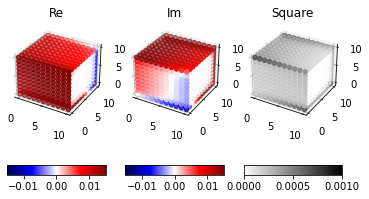

Total probability: (0.9481741647273343+0j)


In [39]:
#plotting the wavefunctions
current=wavefunc1[5]
print('wavefunction array shape',current.shape) #2 solutions, each with 10648 points=11^3 lattice sites, 8 orbitals per site.
orbital=0
solution=0

test=np.reshape(current,(11,11,11,8,2))
x,y,z=np.meshgrid(range(11),range(11),range(11),indexing='ij')

c=test[:,:,:,orbital,solution]
#c/=np.exp(1j*np.angle(c[0, 0, 0]))
c_r=np.real(c)
c_i=np.imag(c)
c_amp=c*np.conj(c)
fig, (ax1, ax2, ax3) = plt.subplots(1,3,subplot_kw=dict(projection='3d'))

#fig,ax=plt.subplots(1,1,subplot_kw=dict(projection='3d'))
ax1.set_title('Re')
ax2.set_title('Im')
ax3.set_title('Square')

img=ax1.scatter(x, y, z, c=c_r,cmap='seismic',vmin=-0.015,vmax=0.015)
img2=ax2.scatter(x, y, z, c=c_i,cmap='seismic',vmin=-0.015,vmax=0.015)
img3=ax3.scatter(x, y, z, c=c_amp,cmap='binary',vmin=0,vmax=0.001)
#img.set_clim(-.015,.015)
#img2.set_clim(-.015,.015)
#img3.set_clim(-.015,.015)
fig.colorbar(img,ax=ax1, pad=.2, aspect=10,location='bottom')
fig.colorbar(img2,ax=ax2, pad=.2, aspect=10,location='bottom')
fig.colorbar(img3,ax=ax3, pad=.2, aspect=10,location='bottom')


#plt.savefig('3dti_wavefunc5') #wavefunc1[5]. corresponds to flux=0.5
#plt.savefig('3dti_wavefunc2') #wavefunc1[2]. corresponds to flux=0.2. chempot barely goes into 1st band
plt.show()
print('Total probability:',np.sum([np.sum(test[:,:,:,i,solution]*np.conj(test[:,:,:,i,solution])) for i in range(8)]))

Nanowire with disorder and high Eta to check if both combined can give a right order of magnitude decrease in signal

# Test case: making sure that the reshaping is done correctly using the 1DNW wavefunctions. Also check that the summation of all orbital probabilities goes to 5%, which is completely different from the 3DTI case.

##Things to do: maybe check orbital probability sum for non-Majorana wavefunction? Need to identify why there is such a large discrepancy with 3DTI wavefunction probability.

(4888, 2)


C:\ProgramData\Anaconda3\envs\kwantenv\lib\site-packages\matplotlib\cbook\__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


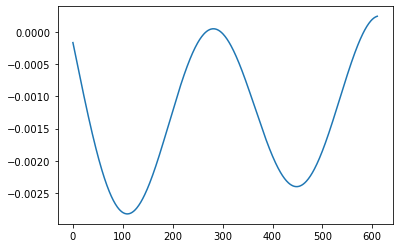

(0.04873730859899945+0j)

In [103]:
filename='Flat_band_highres'
arr,waves,etas=pickle.load(open(filename,'rb'))
test_case=waves[0][0]
print(test_case.shape)
ttcase=test_case.reshape(611,8,2)
lattices=range(611)
print('Total probability:',sum([sum(ttcase[:,i,0]*np.conj(ttcase[:,i,0]))for i in range(8)]))
plt.figure()
plt.plot(lattices,ttcase[:,0,0])
plt.show()


# 3DTI plotting for energy and phase, different flux

In [10]:
## 3DTI for different flux, energy/phase plots
#first, define a wavefunction plotter

def orbital_probability(data,orbital,solution):
    current=data.copy()
    test=np.reshape(current,(11,11,11,8,2))
    x,y,z=np.meshgrid(range(11),range(11),range(11),indexing='ij')
    c=test[:,:,:,orbital,solution]
    c_amp=c*np.conj(c)
    return np.sum(test[:,:,:,orbital,solution]*np.conj(test[:,:,:,orbital,solution]))
    
def plot_3DTI_wavefunc(data,orbital,solution,normalise=False, save=False,name=''):
    '''
    data - wavefunction returned by the boundstate algorithm#
    orbital - orbital number. ranges from 0 to 7
    solution - solution number. generally 0 or 1
    normalise - if true, divide all values by phase of site [0,0,0]
    save - duh
    name - file name for graph
    
    Returns a plot of imaginary, real, and psi^2 for the orbital
    and prints a value for total scattering region probability.
    '''

    current=data.copy()
    test=np.reshape(current,(11,11,11,8,2))
    x,y,z=np.meshgrid(range(11),range(11),range(11),indexing='ij')
    c=test[:,:,:,orbital,solution]
    
    if normalise:
        c/=np.exp(1j*np.angle(c[0, 0, 0]))
        
    c_r=np.real(c)
    c_i=np.imag(c)
    c_amp=c*np.conj(c)
    fig, (ax1, ax2, ax3) = plt.subplots(1,3,subplot_kw=dict(projection='3d'))

    #fig,ax=plt.subplots(1,1,subplot_kw=dict(projection='3d'))
    ax1.set_title('Re')
    ax2.set_title('Im')
    ax3.set_title('Square')

    img=ax1.scatter(x, y, z, c=c_r,cmap='seismic',vmin=-0.015,vmax=0.015)
    img2=ax2.scatter(x, y, z, c=c_i,cmap='seismic',vmin=-0.015,vmax=0.015)
    img3=ax3.scatter(x, y, z, c=c_amp,cmap='binary',vmin=0,vmax=0.001)

    fig.colorbar(img,ax=ax1, pad=.2, aspect=10,orientation='horizontal')
    fig.colorbar(img2,ax=ax2, pad=.2, aspect=10,orientation='horizontal')
    fig.colorbar(img3,ax=ax3, pad=.2, aspect=10,orientation='horizontal')

    if save:
        plt.savefig(filename)

    plt.show()
    print('Total probability:',np.sum([np.sum(test[:,:,:,i,solution]*np.conj(test[:,:,:,i,solution])) for i in range(8)]))
    print('Orbital probability:',np.sum(test[:,:,:,orbital,solution]*np.conj(test[:,:,:,orbital,solution])))
    
def plot_ephase(x,y,pi=2,s=5,label=''):
    plt.scatter(x,y,s=s,label=label)
    plt.ylabel(r'E/$\Delta$')
    plt.xlabel('$\phi$')
    if pi==2:
        plt.xticks(np.linspace(0,2*np.pi,5,endpoint=True), ['0',r'$\frac{\pi}{2}$',r'$\pi$',
                                                     r'$\frac{3\pi}{2}$',r'$2\pi$'])
    elif pi==4:
        plt.xticks(np.linspace(0,4*np.pi,9,endpoint=True), ['0',r'$\frac{\pi}{2}$',r'$\pi$',
                                                     r'$\frac{3\pi}{2}$',r'$2\pi$',
                                                     r'$\frac{5\pi}{2}$',r'$3\pi$',
                                                     r'$\frac{7\pi}{2}$',r'$4\pi$'])
    

# 0 Flux


1 31


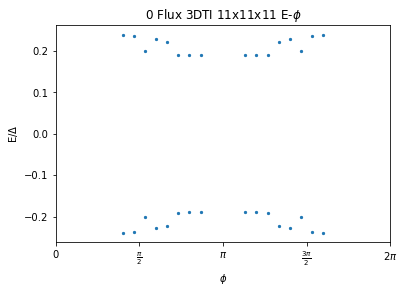

In [13]:
filename='3dti_energy_phase_230122' #only flux 0!
energy_arr,wavefuncs=pickle.load(open(filename,'rb'))
print(len(energy_arr),len(energy_arr[0])) #managed to only run for flux=0


phi_arr=np.linspace(0,2*np.pi,31)
flux_arr=[0,0.25,0.5]
x,y=f.arrange_E(energy_arr[0],phi_arr)
y=[i/0.01 for i in y]
plt.figure()
plot_ephase(x,y,pi=2)
plt.title(r'0 Flux 3DTI 11x11x11 E-$\phi$')
plt.savefig('3dti-0flux-250122')
index_list=[]
for i in range(len(energy_arr[0])):
    if energy_arr[0][i].size!=0:
        index_list.append(i)

non-empty indices,phi [(6, 0.4), (7, 0.467), (8, 0.533), (9, 0.6), (10, 0.667), (11, 0.733), (12, 0.8), (13, 0.867), (17, 1.133), (18, 1.2), (19, 1.267), (20, 1.333), (21, 1.4), (22, 1.467), (23, 1.533), (24, 1.6)]


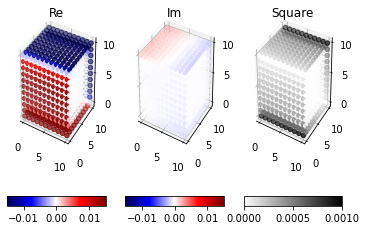

Total probability: (0.9486106884881185+0j)
Orbital probability: (0.16473745491875053+0j)
Phi: 0.4


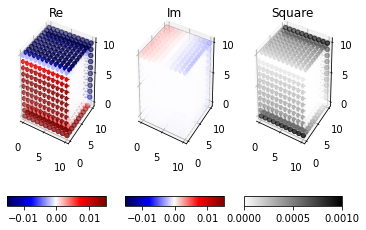

Total probability: (0.9485903206439582+0j)
Orbital probability: (0.16944748607536328+0j)
Phi: 0.467


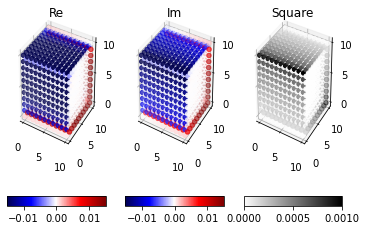

Total probability: (0.9484838927565752+0j)
Orbital probability: (0.21321056692731433+0j)
Phi: 0.533


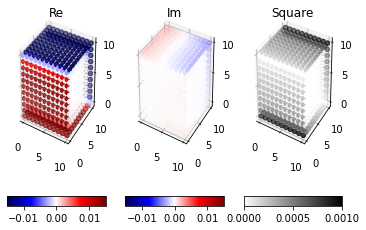

Total probability: (0.9485461270421914+0j)
Orbital probability: (0.18290096964108724+0j)
Phi: 0.6


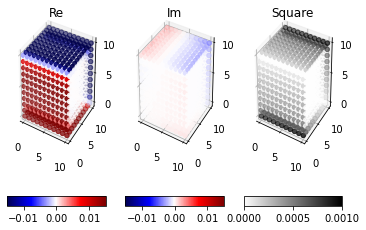

Total probability: (0.9485282663672553+0j)
Orbital probability: (0.19028006763929795+0j)
Phi: 0.667


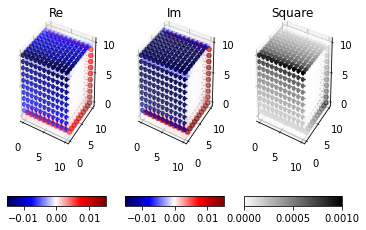

Total probability: (0.9484744323959273+0j)
Orbital probability: (0.2232673125620141+0j)
Phi: 0.733


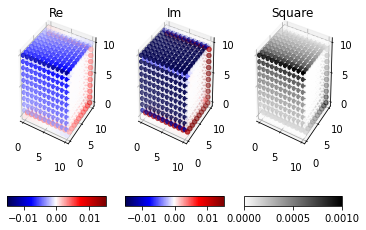

Total probability: (0.9484739076180526+0j)
Orbital probability: (0.2246249313090549+0j)
Phi: 0.8


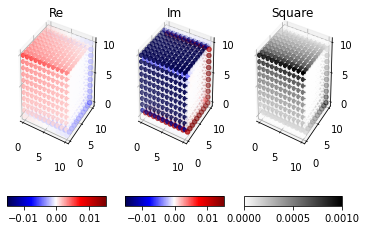

Total probability: (0.9484747219616193+0j)
Orbital probability: (0.22464993580712744+0j)
Phi: 0.867


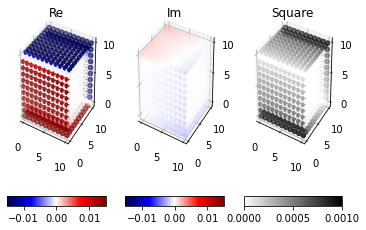

Total probability: (0.9484747219616121+0j)
Orbital probability: (0.2246499358071284+0j)
Phi: 1.133


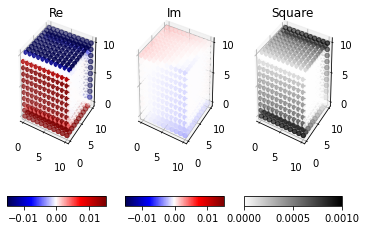

Total probability: (0.9484739076180415+0j)
Orbital probability: (0.224624931309001+0j)
Phi: 1.2


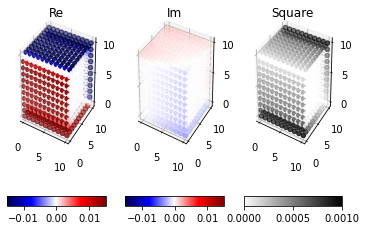

Total probability: (0.9484744323959281+0j)
Orbital probability: (0.2232673125620041+0j)
Phi: 1.267


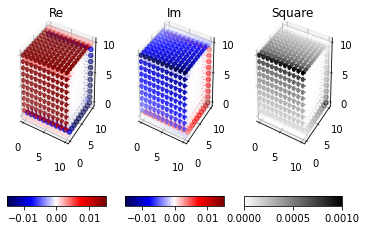

Total probability: (0.9485282663672562+0j)
Orbital probability: (0.19028006763927569+0j)
Phi: 1.333


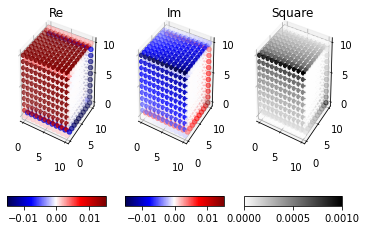

Total probability: (0.9485461270421942+0j)
Orbital probability: (0.18290096964105107+0j)
Phi: 1.4


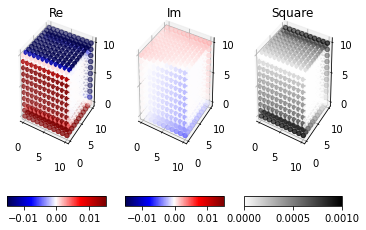

Total probability: (0.9484838927565793+0j)
Orbital probability: (0.2132105669273056+0j)
Phi: 1.467


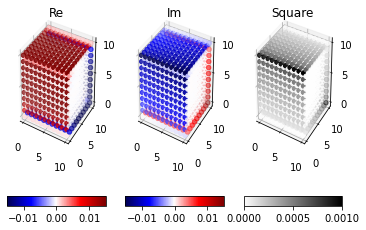

Total probability: (0.9485903206439482+0j)
Orbital probability: (0.16944748607538546+0j)
Phi: 1.533


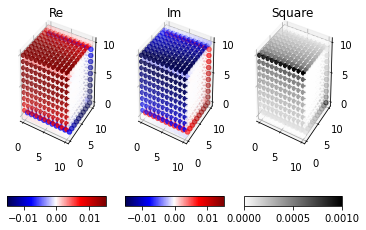

Total probability: (0.9486106884881093+0j)
Orbital probability: (0.1647374549187929+0j)
Phi: 1.6


In [83]:
#wavefunctions plot for 0 flux
print('non-empty indices,phi',[(index_list[i],round(phi_arr[index_list[i]]/np.pi,3)) for i in range(len(index_list))])
#print('phis',np.round(phi_arr[index_list]/np.pi,3))
for i in index_list:
    plot_3DTI_wavefunc(data=wavefuncs[0][i],orbital=6,solution=0,normalise=True, save=False,name='')
    print('Phi:',round(phi_arr[i]/np.pi,3))
#orbital probability seems discontinuous..

## Looking at orbital probabilities for flux 0

In [94]:
import pandas as pd
prob_arr=np.zeros((8,len(index_list)))
for i in range(8):
    for j in range(len(index_list)):
        prob_arr[i,j]=orbital_probability(data=wavefuncs[0][index_list[j]],orbital=i,solution=0)
df=pd.DataFrame(prob_arr,columns=np.round(phi_arr[index_list]/np.pi,3))
df #headers are phi values, rows are orbitals


C:\Users\hht18\AppData\Local\Temp/ipykernel_14428/1517434989.py:5: ComplexWarning: Casting complex values to real discards the imaginary part
  prob_arr[i,j]=orbital_probability(data=wavefuncs[0][index_list[j]],orbital=i,solution=0)


,0.400,0.467,0.533,0.600,0.667,0.733,0.800,0.867,1.133,1.200,1.267,1.333,1.400,1.467,1.533,1.600
0,0.068987,0.064295,0.020675,0.050890,0.043534,0.010636,0.009279,0.009252,0.009252,0.009279,0.010636,0.043534,0.050890,0.020675,0.064295,0.068987
1,0.070893,0.066032,0.020863,0.052146,0.044530,0.010482,0.009080,0.009054,0.009054,0.009080,0.010482,0.044530,0.052146,0.020863,0.066032,0.070893
2,0.068987,0.064295,0.020675,0.050890,0.043534,0.010636,0.009279,0.009252,0.009252,0.009279,0.010636,0.043534,0.050890,0.020675,0.064295,0.068987
3,0.070893,0.066032,0.020863,0.052146,0.044530,0.010482,0.009080,0.009054,0.009054,0.009080,0.010482,0.044530,0.052146,0.020863,0.066032,0.070893
4,0.164737,0.169447,0.213211,0.182901,0.190280,0.223267,0.224625,0.224650,0.224650,0.224625,0.223267,0.190280,0.182901,0.213211,0.169447,0.164737
5,0.169688,0.174521,0.219493,0.188336,0.195920,0.229853,0.231253,0.231281,0.231281,0.231253,0.229853,0.195920,0.188336,0.219493,0.174521,0.169688
6,0.164737,0.169447,0.213211,0.182901,0.190280,0.223267,0.224625,0.224650,0.224650,0.224625,0.223267,0.190280,0.182901,0.213211,0.169447,0.164737
7,0.169688,0.174521,0.219493,0.188336,0.195920,0.229853,0.231253,0.231281,0.231281,0.231253,0.229853,0.195920,0.188336,0.219493,0.174521,0.169688


# Half flux

31


[0, 1, 2, 3, 4, 5, 9, 10, 15, 20, 21, 25, 26, 27, 28, 29, 30]

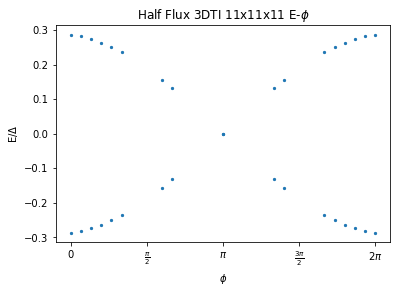

In [35]:
filename2='3dti_energy_phase_230122_halfflux'
energy_arr2,wavefuncs2=pickle.load(open(filename2,'rb'))
print(len(energy_arr2))

phi_arr=np.linspace(0,2*np.pi,31)
x,y=f.arrange_E(energy_arr2,phi_arr)
y=[i/0.01 for i in y]
plt.figure()
plot_ephase(x,y,pi=2)
plt.title(r'Half Flux 3DTI 11x11x11 E-$\phi$')
#plt.savefig('3dti-halfflux-250122')
index_list=[]
for i in range(len(energy_arr2)):
    if energy_arr2[i].size!=0:
        index_list.append(i)
index_list


non-empty indices,phi [(0, 0.0), (1, 0.067), (2, 0.133), (3, 0.2), (4, 0.267), (5, 0.333), (9, 0.6), (10, 0.667), (15, 1.0), (20, 1.333), (21, 1.4), (25, 1.667), (26, 1.733), (27, 1.8), (28, 1.867), (29, 1.933), (30, 2.0)]


C:\ProgramData\Anaconda3\envs\kwantenv\lib\site-packages\matplotlib\axes\_axes.py:4193: ComplexWarning: Casting complex values to real discards the imaginary part
  c = np.asanyarray(c, dtype=float)


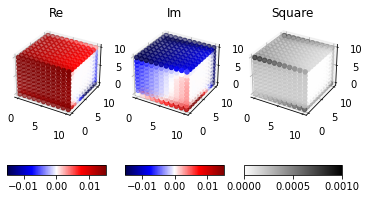

Total probability: (0.9481741647273346+0j)
Orbital probability: (0.11781647468874981+0j)
Phi: 0.0


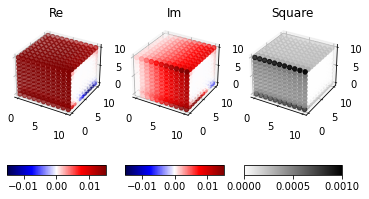

Total probability: (0.9481761983721806+0j)
Orbital probability: (0.11817175423565891+0j)
Phi: 0.067


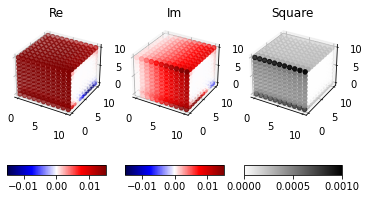

Total probability: (0.9481801947847306+0j)
Orbital probability: (0.11811267981085619+0j)
Phi: 0.133


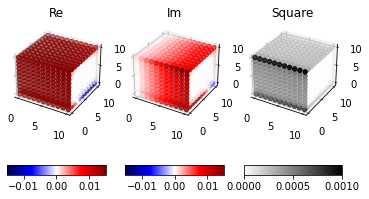

Total probability: (0.9481839684634+0j)
Orbital probability: (0.11806497458008172+0j)
Phi: 0.2


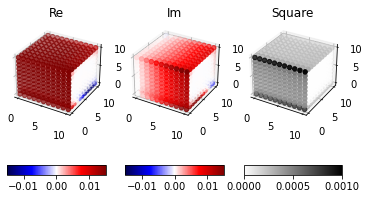

Total probability: (0.9481874955402628+0j)
Orbital probability: (0.1180306800547812+0j)
Phi: 0.267


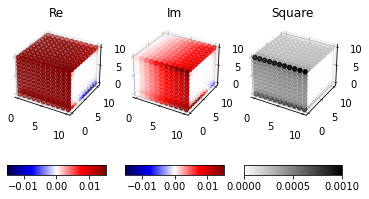

Total probability: (0.9481907570216762+0j)
Orbital probability: (0.1180111572348784+0j)
Phi: 0.333


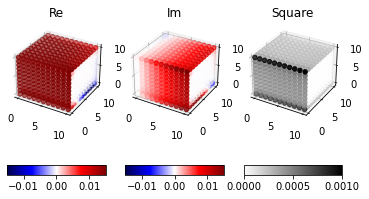

Total probability: (0.9482008936423336+0j)
Orbital probability: (0.11808603974323165+0j)
Phi: 0.6


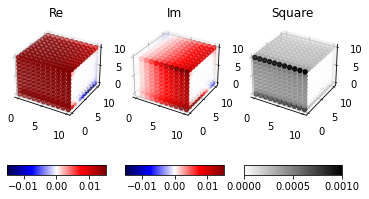

Total probability: (0.9482026600206742+0j)
Orbital probability: (0.11813965063218348+0j)
Phi: 0.667


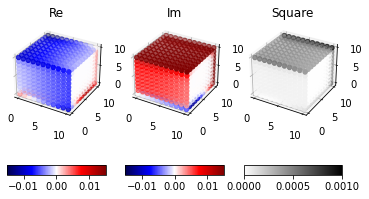

Total probability: (1.0282412044236358+0j)
Orbital probability: (0.12368860600557435+0j)
Phi: 1.0


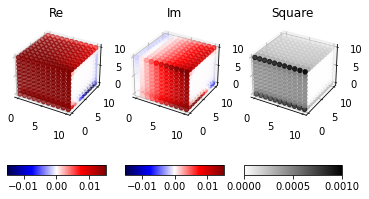

Total probability: (0.9482026600206747+0j)
Orbital probability: (0.11893555334589492+0j)
Phi: 1.333


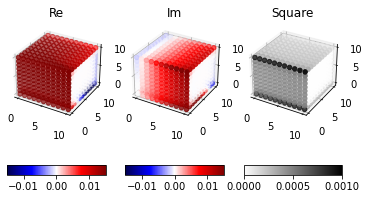

Total probability: (0.9482008936423405+0j)
Orbital probability: (0.1189912914188436+0j)
Phi: 1.4


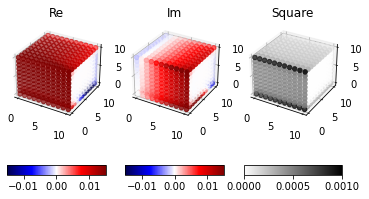

Total probability: (0.9481907570216767+0j)
Orbital probability: (0.11907337213584934+0j)
Phi: 1.667


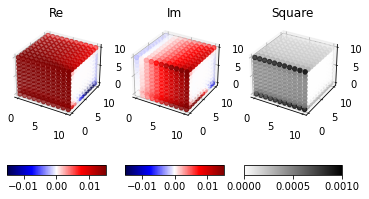

Total probability: (0.948187495540262+0j)
Orbital probability: (0.11905452364336866+0j)
Phi: 1.733


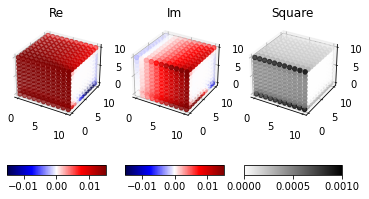

Total probability: (0.9481839684633994+0j)
Orbital probability: (0.11902016495970114+0j)
Phi: 1.8


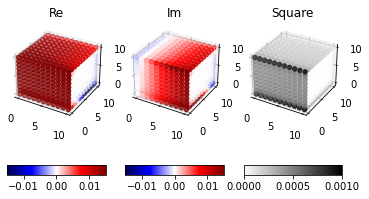

Total probability: (0.9481801947847311+0j)
Orbital probability: (0.11897155356950048+0j)
Phi: 1.867


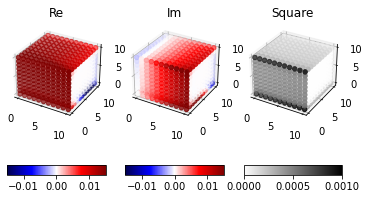

Total probability: (0.9481761983721811+0j)
Orbital probability: (0.11891066419159414+0j)
Phi: 1.933


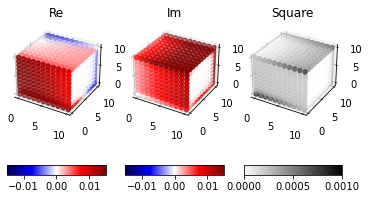

Total probability: (0.9481741647273279+0j)
Orbital probability: (0.11925481547534228+0j)
Phi: 2.0


In [44]:
#wavefunction plot.
solution_indices=[0]*16+[1]*15
print('non-empty indices,phi',[(index_list[i],round(phi_arr[index_list[i]]/np.pi,3)) for i in range(len(index_list))])
#print('phis',np.round(phi_arr[index_list]/np.pi,3))
for i in index_list:
    plot_3DTI_wavefunc(data=wavefuncs2[i],orbital=1,solution=solution_indices[i],normalise=True, save=False,name='')
    print('Phi:',round(phi_arr[i]/np.pi,3))


In [45]:
import pandas as pd
prob_arr=np.zeros((8,len(index_list)))
for i in range(8):
    for j in range(len(index_list)):
        prob_arr[i,j]=round(orbital_probability(data=wavefuncs2[index_list[j]],orbital=i,solution=solution_indices[index_list[j]]),4)
df=pd.DataFrame(prob_arr,columns=np.round(phi_arr[index_list]/np.pi,3))
df.loc['Total']= df.sum()
df

C:\Users\hht18\AppData\Local\Temp\ipykernel_17528\1852867410.py:5: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  prob_arr[i,j]=round(orbital_probability(data=wavefuncs2[index_list[j]],orbital=i,solution=solution_indices[index_list[j]]),4)
C:\Users\hht18\AppData\Local\Temp\ipykernel_17528\1852867410.py:5: ComplexWarning: Casting complex values to real discards the imaginary part
  prob_arr[i,j]=round(orbital_probability(data=wavefuncs2[index_list[j]],orbital=i,solution=solution_indices[index_list[j]]),4)


,0.000,0.067,0.133,0.200,0.267,0.333,0.600,0.667,1.000,1.333,1.400,1.667,1.733,1.800,1.867,1.933,2.000
0,0.1184,0.1183,0.1182,0.1182,0.1181,0.1181,0.1181,0.1182,0.1340,0.1188,0.1189,0.1189,0.1189,0.1188,0.1188,0.1187,0.1186
1,0.1178,0.1182,0.1181,0.1181,0.1180,0.1180,0.1181,0.1181,0.1237,0.1189,0.1190,0.1191,0.1191,0.1190,0.1190,0.1189,0.1193
2,0.1184,0.1183,0.1182,0.1182,0.1181,0.1181,0.1181,0.1182,0.1232,0.1188,0.1189,0.1189,0.1189,0.1188,0.1188,0.1187,0.1186
3,0.1178,0.1182,0.1181,0.1181,0.1180,0.1180,0.1181,0.1181,0.1333,0.1189,0.1190,0.1191,0.1191,0.1190,0.1190,0.1189,0.1193
4,0.1186,0.1187,0.1188,0.1188,0.1189,0.1189,0.1189,0.1188,0.1340,0.1182,0.1181,0.1181,0.1181,0.1182,0.1182,0.1183,0.1184
5,0.1193,0.1189,0.1190,0.1190,0.1191,0.1191,0.1190,0.1189,0.1237,0.1181,0.1181,0.1180,0.1180,0.1181,0.1181,0.1182,0.1178
6,0.1186,0.1187,0.1188,0.1188,0.1189,0.1189,0.1189,0.1188,0.1232,0.1182,0.1181,0.1181,0.1181,0.1182,0.1182,0.1183,0.1184
7,0.1193,0.1189,0.1190,0.1190,0.1191,0.1191,0.1190,0.1189,0.1333,0.1181,0.1181,0.1180,0.1180,0.1181,0.1181,0.1182,0.1178
Total,0.9482,0.9482,0.9482,0.9482,0.9482,0.9482,0.9482,0.9480,1.0284,0.9480,0.9482,0.9482,0.9482,0.9482,0.9482,0.9482,0.9482


# Plotting induced gap overlay

In [26]:
#lead dispersion shouldn't be dependent on phase


In [41]:
phi_arr=np.linspace(0,2*np.pi,31)
e=[]
e2=[]
for phi in phi_arr:
    syst,params_bands=make_3dti(phase=phi)
    bands=kwant.physics.dispersion.Bands(syst.leads[1],params=params_bands)
    bands2=kwant.physics.dispersion.Bands(syst.leads[0],params=params_bands)
    momenta = np.linspace(-np.pi, np.pi, 101)
    band_no=len(bands(0))
    band2_no=len(bands2(0))
    energies=[bands(k) for k in momenta]
    energies2=[bands2(k) for k in momenta]
    lowest_band_index=int(band_no/2)
    low_band_E=[i[lowest_band_index] for i in energies]
    lowest_band_index2=int(band2_no/2)
    low_band_E2=[i[lowest_band_index2] for i in energies]
    e.append(min(low_band_E))
    e2.append(min(low_band_E2))



[0.0029393236551470154, 0.002939323655145683, 0.0029393236551479404, 0.0029393236551472695, 0.0029393236551483173, 0.002939323655147126, 0.0029393236551467075, 0.0029393236551474213, 0.0029393236551487146, 0.002939323655145535, 0.002939323655147624, 0.002939323655147029, 0.002939323655147509, 0.002939323655148693, 0.0029393236551482093, 0.002939323655146756, 0.0029393236551460413, 0.0029393236551480666, 0.0029393236551467448, 0.0029393236551469954, 0.0029393236551473866, 0.0029393236551478173, 0.0029393236551482583, 0.002939323655147658, 0.0029393236551478828, 0.0029393236551487844, 0.00293932365514755, 0.0029393236551476486, 0.002939323655148901, 0.0029393236551469282, 0.0029393236551481564]
[0.0029393236551470154, 0.002939323655145683, 0.0029393236551479404, 0.0029393236551472695, 0.0029393236551483173, 0.002939323655147126, 0.0029393236551467075, 0.0029393236551474213, 0.0029393236551487146, 0.002939323655145535, 0.002939323655147624, 0.002939323655147029, 0.002939323655147509, 0.00

Text(0.5, 1.0, 'Dispersion plot, varying phase')

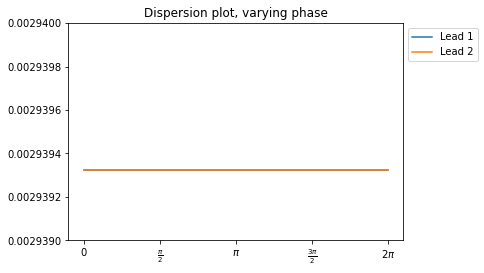

In [42]:
print(e)
print(e2)
plt.figure()
plt.plot(phi_arr,e,label='Lead 1')
plt.plot(phi_arr,e2,label='Lead 2') #phase doesn't affect the dispersion plot.
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.xticks(np.linspace(0,2*np.pi,5,endpoint=True), ['0',r'$\frac{\pi}{2}$',r'$\pi$',
                                                     r'$\frac{3\pi}{2}$',r'$2\pi$'])
plt.ylim(0.002939,0.00294)
plt.title('Dispersion plot, varying phase')

In [43]:
#instead of vary phase, vary FLUX. Re-plot the flux graph
flux_arr=np.linspace(0,1,51)
e=[]
e2=[]
for flux in flux_arr:
    syst,params_bands=make_3dti(phase=0,flux=flux)
    bands=kwant.physics.dispersion.Bands(syst.leads[1],params=params_bands)
    bands2=kwant.physics.dispersion.Bands(syst.leads[0],params=params_bands)
    momenta = np.linspace(-np.pi, np.pi, 101)
    band_no=len(bands(0))
    band2_no=len(bands2(0))
    energies=[bands(k) for k in momenta]
    energies2=[bands2(k) for k in momenta]
    lowest_band_index=int(band_no/2)
    low_band_E=[i[lowest_band_index] for i in energies]
    lowest_band_index2=int(band2_no/2)
    low_band_E2=[i[lowest_band_index2] for i in energies]
    e.append(min(low_band_E))
    e2.append(min(low_band_E2))

[0.0029393236551481564, 0.0021259772770224204, 0.0013113473044079442, 0.0004954541441567138, 0.0003216809691484784, 0.0011400360087713078, 0.0019595881911192857, 0.002780314010609293, 0.0036021892740924636, 0.003924467512888134, 0.003597659264426716, 0.00331501936752008, 0.0030812234356382955, 0.0028995989819761724, 0.002771102476419326, 0.002693483455599153, 0.002661094243068492, 0.0026655503437627006, 0.0026969867805816798, 0.002745388521701239, 0.0028015851432300924, 0.002857791775904457, 0.0029077902417611176, 0.0029469047204502856, 0.002971897118317278, 0.0029808577796612435, 0.0029731290309768874, 0.00294927698097048, 0.002911115678861186, 0.002861780131840692, 0.0028058338890110043, 0.0027493758840837186, 0.0027000743594652126, 0.002667006413210091, 0.0026601490661339556, 0.002689418592592009, 0.002763355153168868, 0.002887842713171801, 0.003065389869497367, 0.0032952577676155967, 0.003574261988005751, 0.003897796577640889, 0.003664787109317522, 0.002842764355518799, 0.002021903

Text(0.5, 1.0, 'Dispersion plot, varying flux')

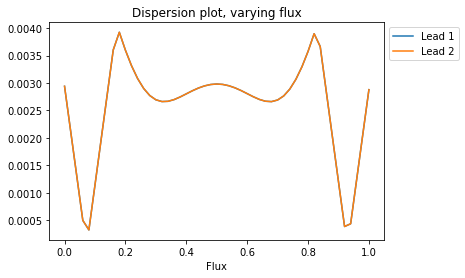

In [44]:
print(e)
print(e2)
plt.figure()
plt.plot(flux_arr,e,label='Lead 1')
plt.plot(flux_arr,e2,label='Lead 2') #phase doesn't affect the dispersion plot.
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.xlabel('Flux')
plt.title('Dispersion plot, varying flux')

# Replotting energy-flux diagram, normalised to actual band gap

[0.0029393236551481564, 0.0011400360087713078, 0.003597659264426716, 0.002693483455599153, 0.0028015851432300924, 0.0029808577796612435, 0.0028058338890110043, 0.002689418592592009, 0.003574261988005751, 0.0012022284398136524, 0.002877561819367036]
[array([], dtype=float64), array([], dtype=float64), array([-0.54406015,  0.54406015]), array([-0.92343024,  0.92343024]), array([-0.98791155,  0.98791155]), array([-0.95902595,  0.95902595]), array([-0.98735925,  0.98735925]), array([-0.92694932,  0.92694932]), array([-0.55058323,  0.55058323]), array([], dtype=float64), array([], dtype=float64)]


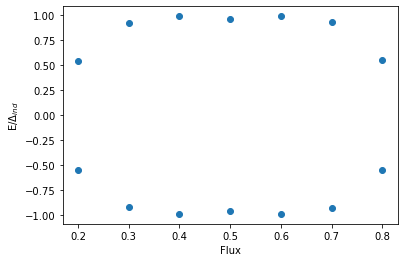

In [60]:
#3dti parameters
flux_norm=e2[::5]
print(flux_norm)
filename='test3dti'
data1,_=pickle.load(open(filename,'rb'))
flux_arr=np.linspace(0,1,11)
a = 10
for i in range(len(data1)):
    for j in range(len(data1[i])):
        data1[i][j]/=flux_norm[i]
print(data1)
plt.figure() #plotting the energy against flux of the 3dti
x,y=f.arrange_E(data1,flux_arr)
plt.scatter(x,y)
plt.xlabel('Flux')
plt.ylabel(r'E/$\Delta_{ind}$')
plt.savefig('Testing 3dti vary flux no superconducting phase normalised to induced gap')

## Analysing high disorder and subband mixing

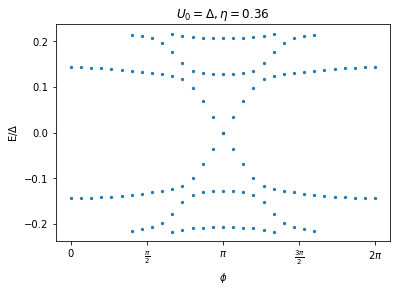

In [3]:

U_0=0.182
phi_arr=np.linspace(0,2*np.pi,31)
eta=0.36
delta=0.182
energy_arr=[]
wavefunc_arr=[]
filename='order_of_magnitude_disorder_mixing'

energy_arr,wavefunc_arr=pickle.load(open(filename,'rb'))
x,y=f.arrange_E(energy_arr,phi_arr)
y=[i/delta for i in y]
plt.figure()
plot_ephase(x,y,pi=2,s=5)
plt.title('$U_0=\Delta, \eta=0.36$')
plt.savefig('disorder_subband_mixing_ephase')

parr,pphi=f.process_data(energy_arr,phi_arr,fill=True,extend=True,single=True)


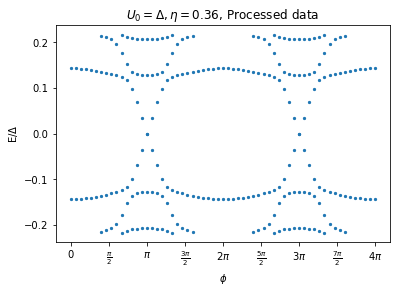

In [17]:
#processing data, filling in gaps and extending to 4pi
x2,y2=f.arrange_E(parr,pphi)
y2=[i/delta for i in y2]
plt.figure()
plot_ephase(x2,y2,pi=4,s=5)
plt.title('$U_0=\Delta, \eta=0.36$, Processed data')
#plt.savefig('disorder_subband_mixing_ephase2')
plt.show()

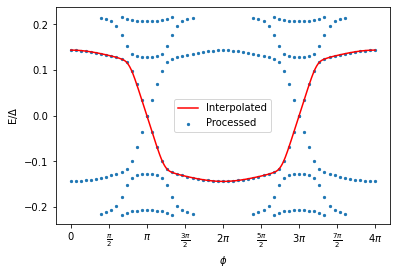

In [18]:
#interpolating
index=int(len(parr[0])/2)
branch,phi=f.gradient_addition(index,parr,pphi,printing=False)
interx,intery=f.interpolate(branch,phi)
plt.plot(interx,intery,'r',label='Interpolated')
plot_ephase(x2,y2,pi=4,s=5,label='Processed')
plt.legend()
plt.savefig('disorder_subband_mixing_ephase_processed_interpolated')

Fourier decomposition: [ 7.41592477e+09  1.26140046e+07 -1.52903209e+09  1.26140093e+07
  5.98271619e+08  1.26140168e+07 -1.40754991e+08  1.26140267e+07
 -4.36729515e+06  1.26140378e+07]


Text(0.5, 1.0, 'Qubit splittings, $E_{C}=512.0 MHz, E_{J}=4.7 GHz,\\eta=0.36$')

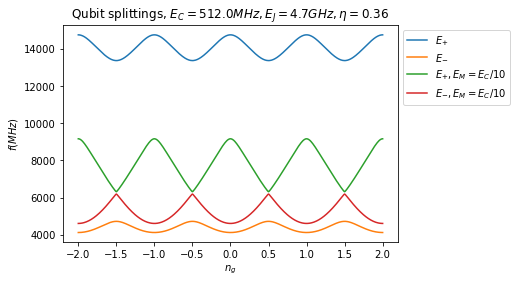

In [25]:
#fourier decomposition
scaled_y=[i/1000*1.6*10**-19/(6.63*10**-34)*delta for i in intery]
coeffs=f.fourier_decompose(scaled_y,interx,modes=10,offset=False)
levels=50
print('Fourier decomposition:',coeffs)
ng=np.linspace(-2,2,9+8*60)
Ec=512*10**6
Ej=4.7*10**9
Em=[5.12*10**7]
energies=np.array([f.qubit_energies(Ec,Ej,coeffs,levels,g)/10**6 for g in ng])
energies2=np.array([f.qubit_energies(Ec,Ej,Em,levels,g)/10**6 for g in ng])
plt.figure()
plt.xlabel(r'$n_g$')
plt.ylabel(r'$f(MHz)$')
plt.plot(ng,energies[:,3]-energies[:,0],label='$E_{+}$')
plt.plot(ng,energies[:,2]-energies[:,1],label='$E_{-}$')
plt.plot(ng,energies2[:,3]-energies2[:,0],label='$E_{+},E_M=E_C/10$')
plt.plot(ng,energies2[:,2]-energies2[:,1],label='$E_{-},E_M=E_C/10$')
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.title(r"Qubit splittings, $E_{C}=%s MHz, E_{J}=%s GHz,\eta=0.36$"%(Ec/10**6,Ej/10**9))

# February

## Averaging disorder + subband mixing plots

In [7]:
filename='order_of_magnitude_disorder_mixing_moredata'
filename2='order_of_magnitude_disorder_mixing'
''' the original code, but there was a propagating mode error somewhere...
for salt in saltarr:
    e_arr2=[]
    w_arr2=[]
    for phi in phi_arr:
        JJ=f.mixed_system_vary_eta_disorder(L_A=3700., W=1400., a=6.0583, m=0.023,
                                            alpha=350., mu=0.887, U_0=U_0, delta=0.182, B_Tesla=1.35,
                                            phi=phi, g=14.7, salt=salt,eta=eta)
        energy,wave=bs.find_boundstates(JJ,-0.182,0.182,rtol=0.182/100)
        e_arr2.append(energy)
        w_arr2.append(wave)
    energy_arr.append(e_arr2)
    wavefunc_arr.append(w_arr2)
    combined=[energy_arr,wavefunc_arr]
    pickle.dump(combined,open(filename,'wb'))
'''
en1,wav1=pickle.load(open(filename2,'rb'))
en_a,wave_a=pickle.load(open(filename,'rb'))
print(len(en_a)) #okay, so only 3 extra copies to work with...
en_a.append(en1)
wave_a.append(wav1)

3


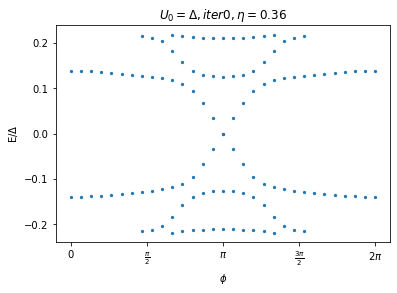

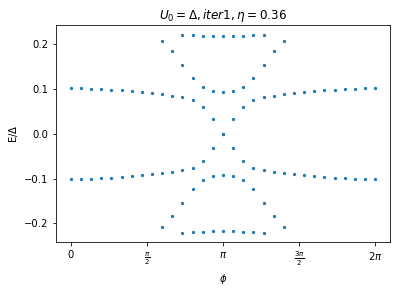

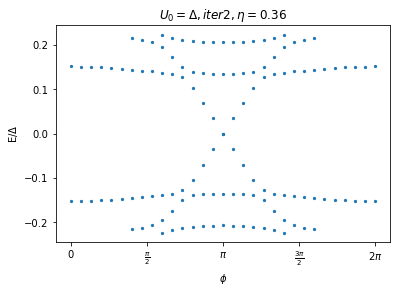

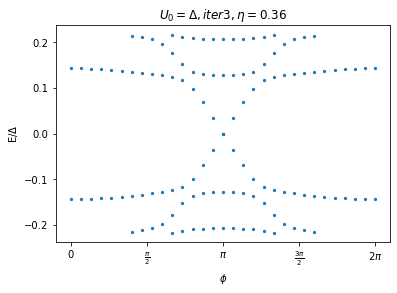

In [10]:
#plot and process all 4 copies of the data together
U_0=0.182
phi_arr=np.linspace(0,2*np.pi,31)
eta=0.36
delta=0.182
parrs=[] #array for processed data from the iterations
pphis=[]
for i in range(4):

    energy_arr=en_a[i]
    phi_arr=np.linspace(0,2*np.pi,31)
    x,y=f.arrange_E(energy_arr,phi_arr)
    y=[i/delta for i in y]
    plt.figure()
    plot_ephase(x,y,pi=2,s=5)
    plt.title(r'$U_0=\Delta, iter %s, \eta=0.36$'%(i))
    

    parr,pphi=f.process_data(energy_arr,phi_arr,fill=True,extend=True,single=True)
    parrs.append(parr)
    pphis.append(pphi)

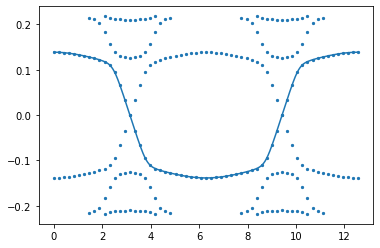

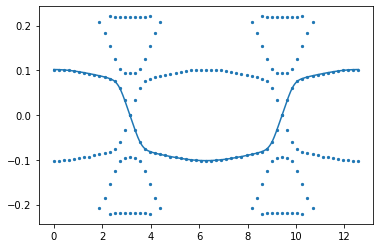

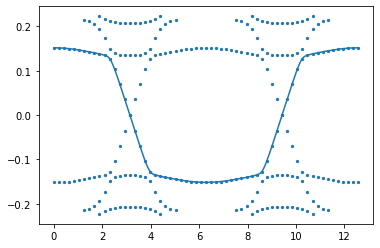

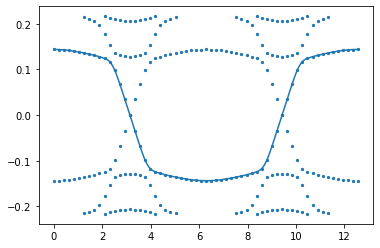

In [18]:
interxs=[]
interys=[]


for i in range(len(parrs)):
    parr=parrs[i]
    pphi=pphis[i]
    index=int(len(parr[0])/2)
    branch,phi=f.gradient_addition(index,parr,pphi,printing=False)
    interx,intery=f.interpolate(branch,phi)
    plt.figure()
    intery=[i/delta for i in intery]
    plt.plot(interx,intery)
    x,y=f.arrange_E(parr,pphi)
    y=[i/delta for i in y]
    plt.scatter(x,y,s=5)
    interxs.append(interx)
    interys.append(intery)

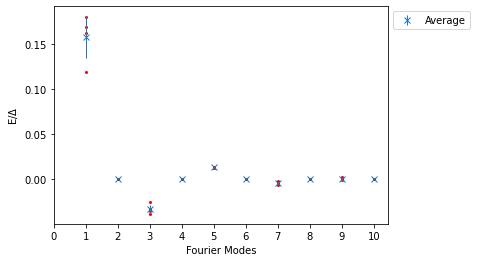

In [42]:
#fourier decompose everything, take a look at the coefficients for each mode and plot
modes=10
coeffs=np.ones((len(interxs),modes))
for i in range(len(interxs)):
    interx=interxs[i] 
    intery=interys[i]
    coeff=f.fourier_decompose(intery,interx,modes=modes,offset=False)
    for j in range(len(coeff)):
        coeffs[i,j]=coeff[j]

plt.figure()

plt.xlabel('Fourier Modes')
plt.ylabel('E/$\Delta$')
avg_y=np.mean(coeffs,axis=0)
std_y=np.std(coeffs,axis=0)
for i in range(len(interxs)):
    plt.plot(range(1,modes+1),coeffs[i,:],'.',color='r',markersize=4)
plt.errorbar(range(1,modes+1),avg_y,yerr=std_y,fmt='x',elinewidth=1,label='Average')
plt.xticks([0,1,2,3,4,5,6,7,8,9,10])
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')

#similar coefficients, biggest change is in 0-phase. Can try plotting variance instead
plt.show()



# Plotting [0.25, 0.75, 1] flux solutions for the 3DTI. Check particularly at pi point, the normalisation

31
[(10648, 2), (10648, 0), (10648, 2), (10648, 2), (10648, 2), (10648, 0), (10648, 0), (10648, 2), (10648, 2), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 2), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 2), (10648, 2), (10648, 0), (10648, 0), (10648, 2), (10648, 2), (10648, 2), (10648, 0), (10648, 2)]


C:\ProgramData\Anaconda3\envs\kwantenv\lib\site-packages\matplotlib\axes\_axes.py:4193: ComplexWarning: Casting complex values to real discards the imaginary part
  c = np.asanyarray(c, dtype=float)


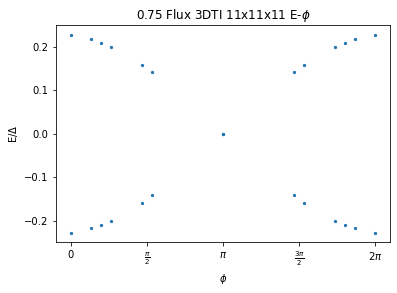

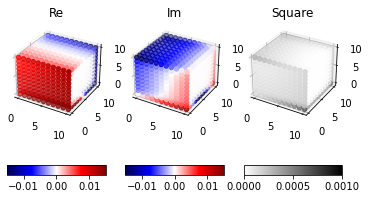

Total probability: (0.9477406560498909+0j)
Orbital probability: (0.06461454340656891+0j)
Phi: 0.0 (10648, 2)


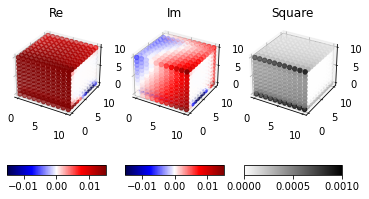

Total probability: (0.9481588583485857+0j)
Orbital probability: (0.11928852028316753+0j)
Phi: 0.133 (10648, 2)


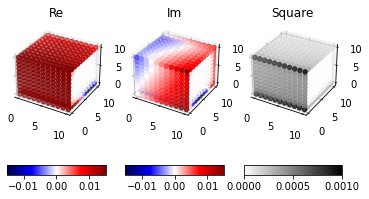

Total probability: (0.9481571526596042+0j)
Orbital probability: (0.11818597846833515+0j)
Phi: 0.2 (10648, 2)


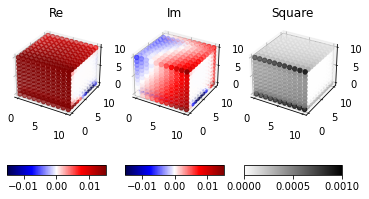

Total probability: (0.9481601895800262+0j)
Orbital probability: (0.11782808969628483+0j)
Phi: 0.267 (10648, 2)


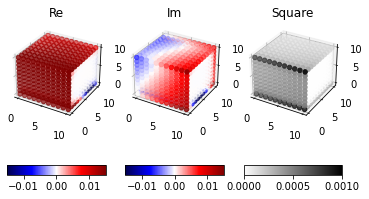

Total probability: (0.9481743077258645+0j)
Orbital probability: (0.11793109737270455+0j)
Phi: 0.467 (10648, 2)


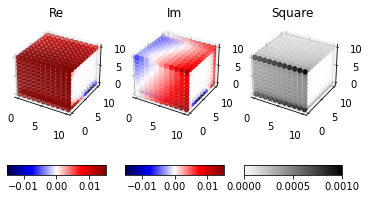

Total probability: (0.9481787130533846+0j)
Orbital probability: (0.11806555231438307+0j)
Phi: 0.533 (10648, 2)


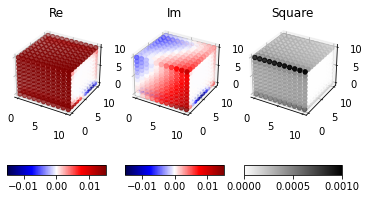

Total probability: (0.9830489864232945+0j)
Orbital probability: (0.11367120497050336+0j)
Phi: 1.0 (10648, 2)


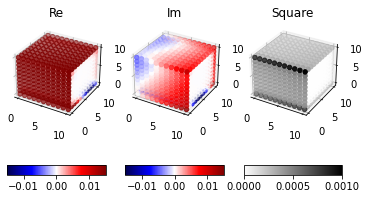

Total probability: (0.9481787130533876+0j)
Orbital probability: (0.11949960293652118+0j)
Phi: 1.467 (10648, 2)


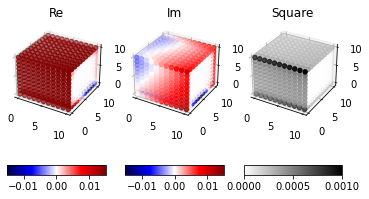

Total probability: (0.9481743077258618+0j)
Orbital probability: (0.11963866838497941+0j)
Phi: 1.533 (10648, 2)


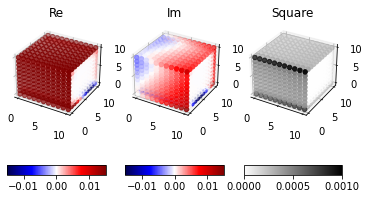

Total probability: (0.948160189580032+0j)
Orbital probability: (0.11974510261104038+0j)
Phi: 1.733 (10648, 2)


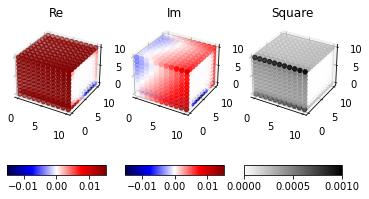

Total probability: (0.9481571526596068+0j)
Orbital probability: (0.11938370817942626+0j)
Phi: 1.8 (10648, 2)


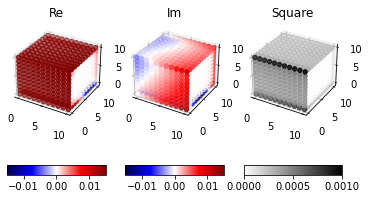

Total probability: (0.9481588583485855+0j)
Orbital probability: (0.11827541783031098+0j)
Phi: 1.867 (10648, 2)


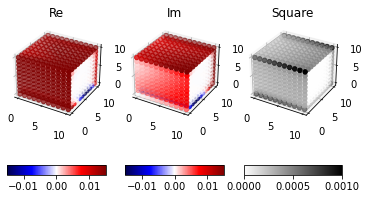

Total probability: (0.9477406560498699+0j)
Orbital probability: (0.17288862735434185+0j)
Phi: 2.0 (10648, 2)


C:\Users\hht18\AppData\Local\Temp\ipykernel_17528\2089877970.py:23: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  prob_arr[i,j]=round(orbital_probability(data=wavefuncs[index_list[j]],orbital=i,solution=solution_indices[index_list[j]]),4)
C:\Users\hht18\AppData\Local\Temp\ipykernel_17528\2089877970.py:23: ComplexWarning: Casting complex values to real discards the imaginary part
  prob_arr[i,j]=round(orbital_probability(data=wavefuncs[index_list[j]],orbital=i,solution=solution_indices[index_list[j]]),4)


,0.000,0.133,0.200,0.267,0.467,0.533,1.000,1.467,1.533,1.733,1.800,1.867,2.000
0,0.1717,0.1179,0.1190,0.1193,0.1192,0.1191,0.1192,0.1174,0.1173,0.1172,0.1175,0.1186,0.0647
1,0.1729,0.1183,0.1194,0.1197,0.1196,0.1195,0.1325,0.1181,0.1179,0.1178,0.1182,0.1193,0.0646
2,0.1717,0.1179,0.1190,0.1193,0.1192,0.1191,0.1262,0.1174,0.1173,0.1172,0.1175,0.1186,0.0647
3,0.1729,0.1183,0.1194,0.1197,0.1196,0.1195,0.1137,0.1181,0.1179,0.1178,0.1182,0.1193,0.0646
4,0.0647,0.1186,0.1175,0.1172,0.1173,0.1174,0.1192,0.1191,0.1192,0.1193,0.1190,0.1179,0.1717
5,0.0646,0.1193,0.1182,0.1178,0.1179,0.1181,0.1325,0.1195,0.1196,0.1197,0.1194,0.1183,0.1729
6,0.0647,0.1186,0.1175,0.1172,0.1173,0.1174,0.1262,0.1191,0.1192,0.1193,0.1190,0.1179,0.1717
7,0.0646,0.1193,0.1182,0.1178,0.1179,0.1181,0.1137,0.1195,0.1196,0.1197,0.1194,0.1183,0.1729
Total,0.9478,0.9482,0.9482,0.9480,0.9480,0.9482,0.9832,0.9482,0.9480,0.9480,0.9482,0.9482,0.9478


In [50]:
filename='3dti_energy_phase_230122_threequartflux' #this IS in the topological regime. 0.75 flux
energy_arr,wavefuncs=pickle.load(open(filename,'rb'))
print(len(energy_arr)) #checking it was comepletely run
print([wavefuncs[i].shape for i in range(31)])
phi_arr=np.linspace(0,2*np.pi,31)
x,y=f.arrange_E(energy_arr,phi_arr)
y=[i/0.01 for i in y]
plt.figure()
plot_ephase(x,y,pi=2)
plt.title(r'0.75 Flux 3DTI 11x11x11 E-$\phi$')
plt.savefig('3dti-threequartflux-010222')
index_list=[]
solution_indices=[0]*15+[1]*16
for i in range(len(energy_arr)):
    if energy_arr[i].size!=0:
        index_list.append(i)
for i in index_list:
    plot_3DTI_wavefunc(data=wavefuncs[i],orbital=7,solution=solution_indices[i],normalise=True, save=False,name='')
    print('Phi:',round(phi_arr[i]/np.pi,3),wavefuncs[i].shape)
prob_arr=np.zeros((8,len(index_list)))
for i in range(8):
    for j in range(len(index_list)):
        prob_arr[i,j]=round(orbital_probability(data=wavefuncs[index_list[j]],orbital=i,solution=solution_indices[index_list[j]]),4)
import pandas as pd
df=pd.DataFrame(prob_arr,columns=np.round(phi_arr[index_list]/np.pi,3))
df.loc['Total']= df.sum()
df

31
[(10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 0), (10648, 1), (10648, 0), (10648, 2), (10648, 0), (10648, 1), (10648, 0), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2), (10648, 2)]
index 0


C:\ProgramData\Anaconda3\envs\kwantenv\lib\site-packages\matplotlib\axes\_axes.py:4193: ComplexWarning: Casting complex values to real discards the imaginary part
  c = np.asanyarray(c, dtype=float)


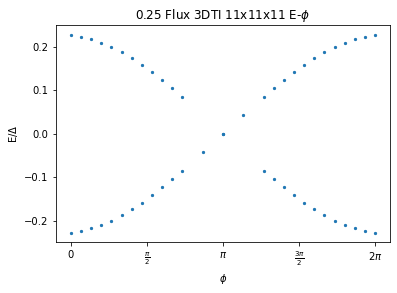

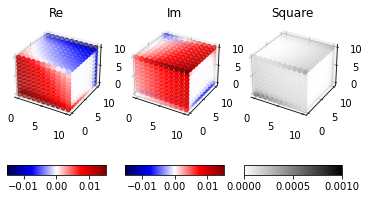

Total probability: (0.9477387470818706+0j)
Orbital probability: (0.06405642204589958+0j)
Phi: 0.0
index 1


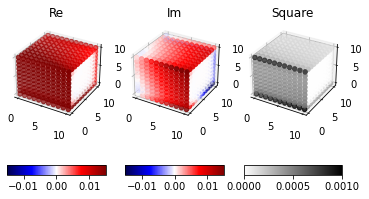

Total probability: (0.9481822599837776+0j)
Orbital probability: (0.12378411199181463+0j)
Phi: 0.067
index 2


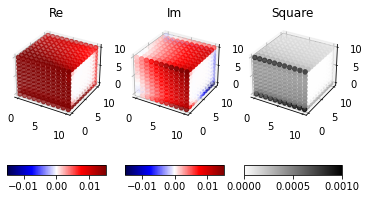

Total probability: (0.9481592281602021+0j)
Orbital probability: (0.11960534797202245+0j)
Phi: 0.133
index 3


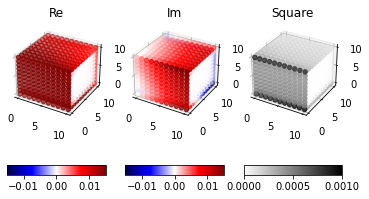

Total probability: (0.9481574383847104+0j)
Orbital probability: (0.11846190179693586+0j)
Phi: 0.2
index 4


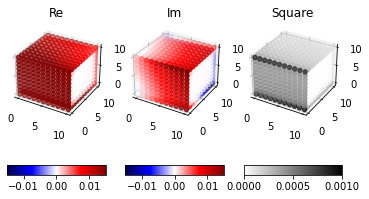

Total probability: (0.9481604909706125+0j)
Orbital probability: (0.118087612980419+0j)
Phi: 0.267
index 5


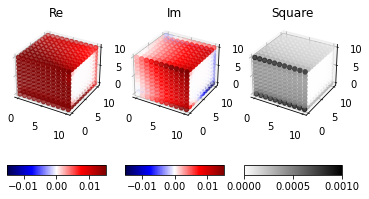

Total probability: (0.9481650415509939+0j)
Orbital probability: (0.11801133009888286+0j)
Phi: 0.333
index 6


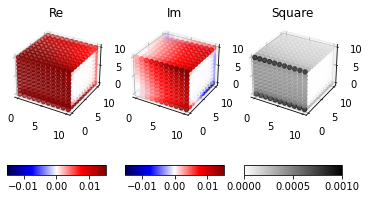

Total probability: (0.9481699641895429+0j)
Orbital probability: (0.1180683899730724+0j)
Phi: 0.4
index 7


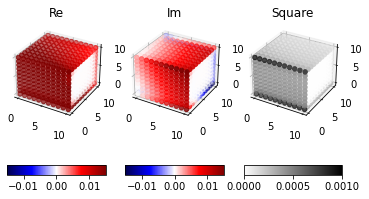

Total probability: (0.9481747753717853+0j)
Orbital probability: (0.11818469191606132+0j)
Phi: 0.467
index 8


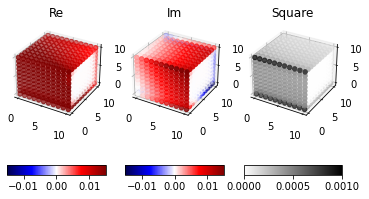

Total probability: (0.9481792365214445+0j)
Orbital probability: (0.11832232329279388+0j)
Phi: 0.533
index 9


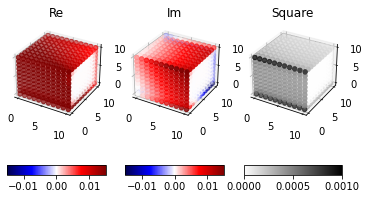

Total probability: (0.9481832197763247+0j)
Orbital probability: (0.11846104490319317+0j)
Phi: 0.6
index 10


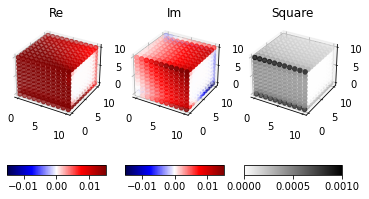

Total probability: (0.9481866532443299+0j)
Orbital probability: (0.11859050190810631+0j)
Phi: 0.667
index 11


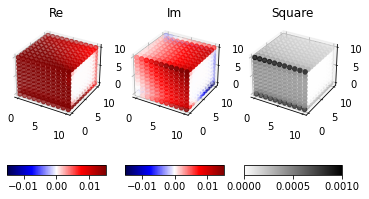

Total probability: (0.9481894955023356+0j)
Orbital probability: (0.11870635717626302+0j)
Phi: 0.733
index 13


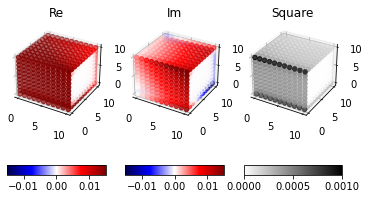

Total probability: (0.9481933205021393+0j)
Orbital probability: (0.11889770824391038+0j)
Phi: 0.867
index 15


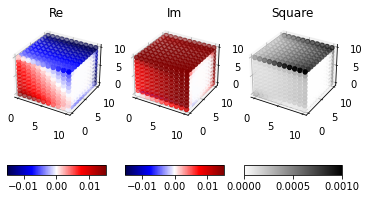

Total probability: (1.3397632042965442+0j)
Orbital probability: (0.14097166985396045+0j)
Phi: 1.0
index 17


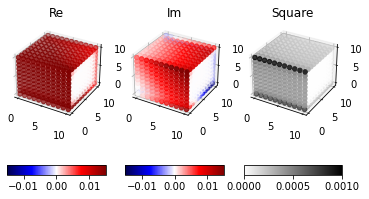

Total probability: (0.9481933205021592+0j)
Orbital probability: (0.11921551262778426+0j)
Phi: 1.133
index 19


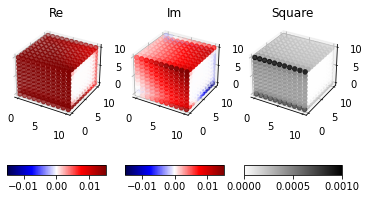

Total probability: (0.9481894955023361+0j)
Orbital probability: (0.11941311385609399+0j)
Phi: 1.267
index 20


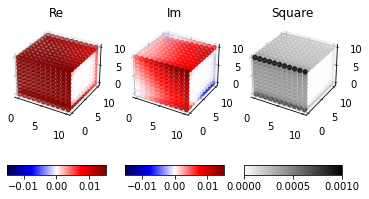

Total probability: (0.9481866532443364+0j)
Orbital probability: (0.11953294840518998+0j)
Phi: 1.333
index 21


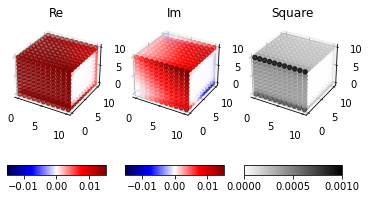

Total probability: (0.9481832197763255+0j)
Orbital probability: (0.11966647581765864+0j)
Phi: 1.4
index 22


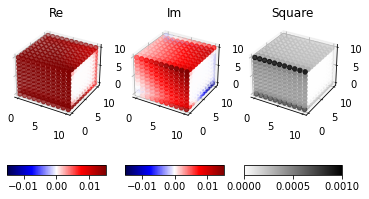

Total probability: (0.9481792365214397+0j)
Orbital probability: (0.1198089318043372+0j)
Phi: 1.467
index 23


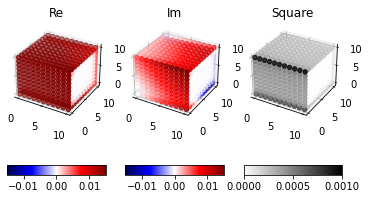

Total probability: (0.948174775371778+0j)
Orbital probability: (0.11994950569032282+0j)
Phi: 1.533
index 24


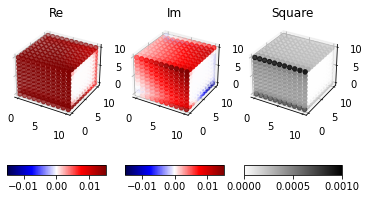

Total probability: (0.9481699641895416+0j)
Orbital probability: (0.12006750342045072+0j)
Phi: 1.6
index 25


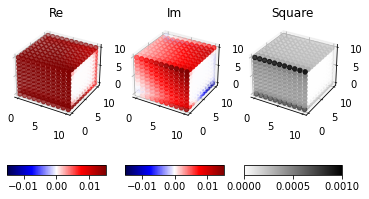

Total probability: (0.9481650415510077+0j)
Orbital probability: (0.12012459664931964+0j)
Phi: 1.667
index 26


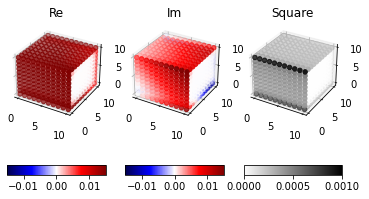

Total probability: (0.9481604909706131+0j)
Orbital probability: (0.12004635833922919+0j)
Phi: 1.733
index 27


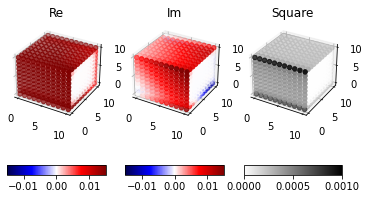

Total probability: (0.9481574383847111+0j)
Orbital probability: (0.11966796457970783+0j)
Phi: 1.8
index 28


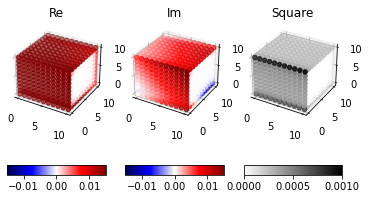

Total probability: (0.9481592281602021+0j)
Orbital probability: (0.11851844890656957+0j)
Phi: 1.867
index 29


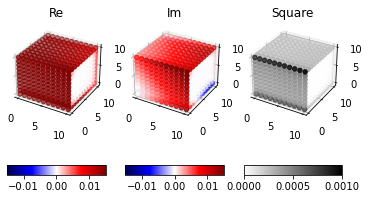

Total probability: (0.9481822599837754+0j)
Orbital probability: (0.11433318551558311+0j)
Phi: 1.933
index 30


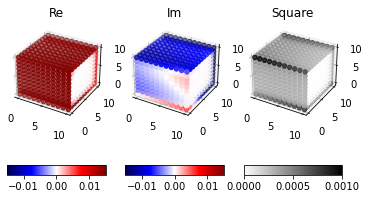

Total probability: (0.9477387470818476+0j)
Orbital probability: (0.17400929125702494+0j)
Phi: 2.0


C:\Users\hht18\AppData\Local\Temp\ipykernel_17528\2565920862.py:26: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  prob_arr[i,j]=round(orbital_probability(data=wavefuncs[index_list[j]],orbital=i,solution=solution_indices[index_list[j]]),4)
C:\Users\hht18\AppData\Local\Temp\ipykernel_17528\2565920862.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  prob_arr[i,j]=round(orbital_probability(data=wavefuncs[index_list[j]],orbital=i,solution=solution_indices[index_list[j]]),4)


,0.000,0.067,0.133,0.200,0.267,0.333,0.400,0.467,0.533,0.600,...,1.400,1.467,1.533,1.600,1.667,1.733,1.800,1.867,1.933,2.000
0,0.1712,0.1135,0.1176,0.1187,0.1190,0.1191,0.1190,0.1189,0.1188,0.1186,...,0.1173,0.1172,0.1170,0.1169,0.1168,0.1169,0.1173,0.1184,0.1224,0.0646
1,0.1740,0.1143,0.1185,0.1197,0.1200,0.1201,0.1201,0.1199,0.1198,0.1197,...,0.1185,0.1183,0.1182,0.1181,0.1180,0.1181,0.1185,0.1196,0.1238,0.0641
2,0.1712,0.1135,0.1176,0.1187,0.1190,0.1191,0.1190,0.1189,0.1188,0.1186,...,0.1173,0.1172,0.1170,0.1169,0.1168,0.1169,0.1173,0.1184,0.1224,0.0646
3,0.1740,0.1143,0.1185,0.1197,0.1200,0.1201,0.1201,0.1199,0.1198,0.1197,...,0.1185,0.1183,0.1182,0.1181,0.1180,0.1181,0.1185,0.1196,0.1238,0.0641
4,0.0646,0.1224,0.1184,0.1173,0.1169,0.1168,0.1169,0.1170,0.1172,0.1173,...,0.1186,0.1188,0.1189,0.1190,0.1191,0.1190,0.1187,0.1176,0.1135,0.1712
5,0.0641,0.1238,0.1196,0.1185,0.1181,0.1180,0.1181,0.1182,0.1183,0.1185,...,0.1197,0.1198,0.1199,0.1201,0.1201,0.1200,0.1197,0.1185,0.1143,0.1740
6,0.0646,0.1224,0.1184,0.1173,0.1169,0.1168,0.1169,0.1170,0.1172,0.1173,...,0.1186,0.1188,0.1189,0.1190,0.1191,0.1190,0.1187,0.1176,0.1135,0.1712
7,0.0641,0.1238,0.1196,0.1185,0.1181,0.1180,0.1181,0.1182,0.1183,0.1185,...,0.1197,0.1198,0.1199,0.1201,0.1201,0.1200,0.1197,0.1185,0.1143,0.1740
Total,0.9478,0.9480,0.9482,0.9484,0.9480,0.9480,0.9482,0.9480,0.9482,0.9482,...,0.9482,0.9482,0.9480,0.9482,0.9480,0.9480,0.9484,0.9482,0.9480,0.9478


In [53]:
# 0.25 flux
filename='3dti_energy_phase_230122_quarterflux'
energy_arr,wavefuncs=pickle.load(open(filename,'rb'))
print(len(energy_arr)) #checking it was comepletely run
print([wavefuncs[i].shape for i in range(31)])
phi_arr=np.linspace(0,2*np.pi,31)
x,y=f.arrange_E(energy_arr,phi_arr)
y=[i/0.01 for i in y]
plt.figure()
plot_ephase(x,y,pi=2)
plt.title(r'0.25 Flux 3DTI 11x11x11 E-$\phi$')
plt.savefig('3dti-quarterflux-010222')
index_list=[]
solution_indices=[0]*15+[0]+[0]*2+[1]*13 #specify the branch we are tracking. In this case, it is the bottom branch. Abit wonky
#because the solutions aren't symmetric in this case
for i in range(len(energy_arr)):
    if energy_arr[i].size!=0:
        index_list.append(i)
for i in index_list:
    print('index',i)
    plot_3DTI_wavefunc(data=wavefuncs[i],orbital=7,solution=solution_indices[i],normalise=True, save=False,name='')
    print('Phi:',round(phi_arr[i]/np.pi,3))
prob_arr=np.zeros((8,len(index_list)))
for i in range(8):
    for j in range(len(index_list)):
        prob_arr[i,j]=round(orbital_probability(data=wavefuncs[index_list[j]],orbital=i,solution=solution_indices[index_list[j]]),4)
import pandas as pd
df=pd.DataFrame(prob_arr,columns=np.round(phi_arr[index_list]/np.pi,3))
pd.set_option('display.expand_frame_repr', False)
df.loc['Total']= df.sum()
df

In [54]:
df.iloc[:,10:18]

,0.667,0.733,0.867,1.000,1.133,1.267,1.333,1.400
0,0.1185,0.1184,0.1182,0.1580,0.1178,0.1176,0.1175,0.1173
1,0.1195,0.1194,0.1192,0.1936,0.1189,0.1187,0.1186,0.1185
2,0.1185,0.1184,0.1182,0.1774,0.1178,0.1176,0.1175,0.1173
3,0.1195,0.1194,0.1192,0.1410,0.1189,0.1187,0.1186,0.1185
4,0.1175,0.1176,0.1178,0.1580,0.1182,0.1184,0.1185,0.1186
5,0.1186,0.1187,0.1189,0.1936,0.1192,0.1194,0.1195,0.1197
6,0.1175,0.1176,0.1178,0.1774,0.1182,0.1184,0.1185,0.1186
7,0.1186,0.1187,0.1189,0.1410,0.1192,0.1194,0.1195,0.1197
Total,0.9482,0.9482,0.9482,1.3400,0.9482,0.9482,0.9482,0.9482


31
[(10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0), (10648, 0)]


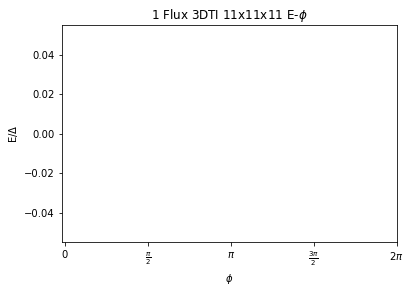

In [57]:
#flux=1 solutions
# 1 flux
filename='3dti_energy_phase_230122_oneflux'
energy_arr,wavefuncs=pickle.load(open(filename,'rb'))
print(len(energy_arr)) #checking it was comepletely run
print([wavefuncs[i].shape for i in range(31)])
phi_arr=np.linspace(0,2*np.pi,31)
x,y=f.arrange_E(energy_arr,phi_arr)
y=[i/0.01 for i in y]
plt.figure()
plot_ephase(x,y,pi=2)
plt.title(r'1 Flux 3DTI 11x11x11 E-$\phi$')
plt.savefig('3dti-oneflux-010222')
index_list=[]
solution_indices=[0]*15+[0]+[0]*2+[1]*13 #specify the branch we are tracking. In this case, it is the bottom branch. Abit wonky
#because the solutions aren't symmetric in this case
for i in range(len(energy_arr)):
    if energy_arr[i].size!=0:
        index_list.append(i)
for i in index_list:
    print('index',i)
    plot_3DTI_wavefunc(data=wavefuncs[i],orbital=7,solution=solution_indices[i],normalise=True, save=False,name='')
    print('Phi:',round(phi_arr[i]/np.pi,3))
prob_arr=np.zeros((8,len(index_list)))
for i in range(8):
    for j in range(len(index_list)):
        prob_arr[i,j]=round(orbital_probability(data=wavefuncs[index_list[j]],orbital=i,solution=solution_indices[index_list[j]]),4)

df=pd.DataFrame(prob_arr,columns=np.round(phi_arr[index_list]/np.pi,3))

#df.loc['Total']= df.sum()
#df

# Investigating integer pi phase solutions

In [75]:
''' #run once to make the new array for 0 flux, easier formatting.
filename='3dti_energy_phase_230122'
energy_arr,wavefuncs=pickle.load(open(filename,'rb'))
combined=[energy_arr[0],wavefuncs[0]]
pickle.dump(combined,open('3dti_energy_phase_230122_zeroflux','wb'))
'''
filename5='3dti_energy_phase_230122_oneflux'
filename2='3dti_energy_phase_230122_quarterflux'
filename4='3dti_energy_phase_230122_threequartflux'
filename3='3dti_energy_phase_230122_halfflux'
filename1='3dti_energy_phase_230122_zeroflux' #only 1st element is nonzero
filenames=[filename1,filename2,filename3,filename4,filename5]

#first load the data
energies=[]
wavefunctions=[]
for filename in filenames:
    e,w=pickle.load(open(filename,'rb'))
    energies.append(e)
    wavefunctions.append(w)

Flux 0.25 -----------------------------


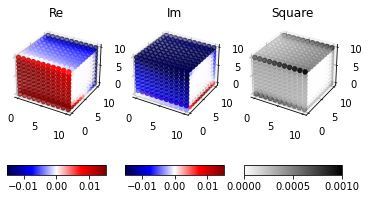

Total probability: (0.9477387470818706+0j)
Orbital probability: (0.171224523203385+0j)
Phase 0, solution 0


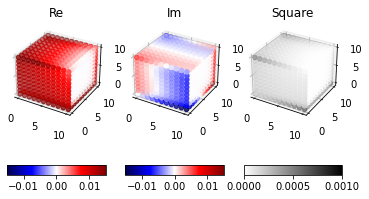

Total probability: (0.9477387470818475+0j)
Orbital probability: (0.06457913703576235+0j)
Phase 2pi, solution 0
Flux 0.5 -----------------------------


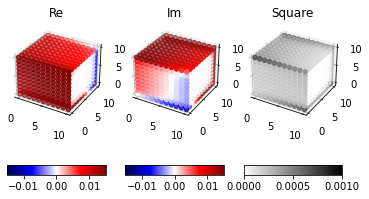

Total probability: (0.9481741647273346+0j)
Orbital probability: (0.11844395259255543+0j)
Phase 0, solution 0


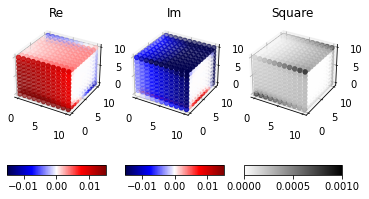

Total probability: (0.9481741647273279+0j)
Orbital probability: (0.11857183894571335+0j)
Phase 2pi, solution 0
Flux 0.75 -----------------------------


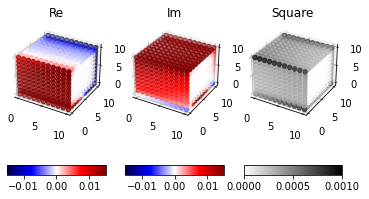

Total probability: (0.9477406560498908+0j)
Orbital probability: (0.17171570540468878+0j)
Phase 0, solution 0


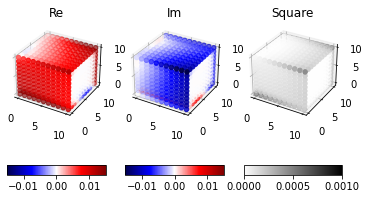

Total probability: (0.9477406560498699+0j)
Orbital probability: (0.06465145185560815+0j)
Phase 2pi, solution 0


In [77]:
#step 1, make sure that the 0, pi phase plots are equivalent
fluxarr=[0,0.25,0.5,0.75,1] #0 and 1 have no solutions at 0/2pi phase
for i in range(1,len(wavefunctions)-1):
    phase0=wavefunctions[i][0]
    phase2pi=wavefunctions[i][-1]
    print('Flux',fluxarr[i],'-----------------------------')
    plot_3DTI_wavefunc(data=phase0,orbital=0,solution=0,normalise=True, save=False,name='')
    print('Phase 0, solution 0')
    plot_3DTI_wavefunc(data=phase2pi,orbital=0,solution=1,normalise=True, save=False,name='') #change to 0 to show they are same
    print('Phase 2pi, solution 0')

In [89]:
#now plot the pi point solutions side-by side

prob_arr=np.zeros((8,(len(wavefunctions)-2)*2)) #-1 because flux 0,1 has no solutions. *2 because we want 2 solutions each.
for i in range(prob_arr.shape[0]):
    for j in range(int(prob_arr.shape[1]/2)):
        prob_arr[i,2*j]=round(orbital_probability(data=wavefunctions[j+1][15],orbital=i,solution=0),4) #j+1 because we ignore 0 flux
        prob_arr[i,2*j+1]=round(orbital_probability(data=wavefunctions[j+1][15],orbital=i,solution=1),4)
df=pd.DataFrame(prob_arr,columns=['Flux 0.25 1','Flux 0.25 2','Flux 0.5 1','Flux 0.5 2', 'Flux 0.75 1', 'Flux 0.75 2'])
df.loc['Total']= df.sum()
df

C:\Users\hht18\AppData\Local\Temp\ipykernel_17528\2691507810.py:6: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  prob_arr[i,2*j]=round(orbital_probability(data=wavefunctions[j+1][15],orbital=i,solution=0),4) #j+1 because we ignore 0 flux
C:\Users\hht18\AppData\Local\Temp\ipykernel_17528\2691507810.py:6: ComplexWarning: Casting complex values to real discards the imaginary part
  prob_arr[i,2*j]=round(orbital_probability(data=wavefunctions[j+1][15],orbital=i,solution=0),4) #j+1 because we ignore 0 flux
C:\Users\hht18\AppData\Local\Temp\ipykernel_17528\2691507810.py:7: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  prob_arr[i,2*j+1]=round(orbital_probability(data=wavefunctions[j+1][15],orbital=i,solution=1),4)
C:\Users\hht18\AppDat

,Flux 0.25 1,Flux 0.25 2,Flux 0.5 1,Flux 0.5 2,Flux 0.75 1,Flux 0.75 2
0,0.1580,0.0628,0.1340,0.0921,0.1094,0.1192
1,0.1936,0.0687,0.1237,0.0965,0.1127,0.1325
2,0.1774,0.0656,0.1232,0.0970,0.1113,0.1262
3,0.1410,0.0613,0.1333,0.0921,0.1077,0.1137
4,0.1580,0.0628,0.1340,0.0921,0.1094,0.1192
5,0.1936,0.0687,0.1237,0.0965,0.1127,0.1325
6,0.1774,0.0656,0.1232,0.0970,0.1113,0.1262
7,0.1410,0.0613,0.1333,0.0921,0.1077,0.1137
Total,1.3400,0.5168,1.0284,0.7554,0.8822,0.9832


In [90]:
1.34+.5168, 1.0284+.7554, .8822+.9832

(1.8568000000000002, 1.7837999999999998, 1.8654)

# Fourier analysis and qubit spectra for 3DTI 

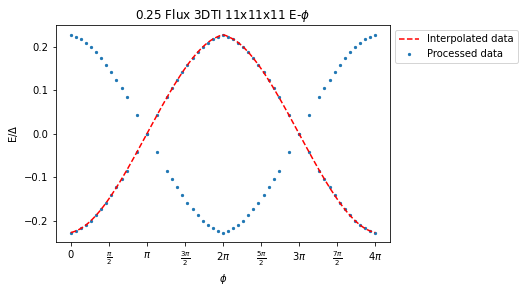

In [2]:
#quarter flux since we have a better graph for that
filename='3dti_energy_phase_230122_quarterflux'
e,w=pickle.load(open(filename,'rb'))
phi_arr=np.linspace(0,2*np.pi,31)
delta=0.01
parr,pphi=f.process_data(e,phi_arr,fill=True,extend=True,single=True)

index=0
branch,phi=f.gradient_addition(index,parr,pphi,printing=False) 
interx,intery=f.interpolate(branch,phi)
plt.figure()

x,y=f.arrange_E(parr,pphi)
intery=[i/delta for i in intery]
y=[i/delta for i in y]
plt.plot(interx,intery,'--',label='Interpolated data',color='r')
plot_ephase(x,y,pi=4,label='Processed data')
plt.title(r'0.25 Flux 3DTI 11x11x11 E-$\phi$')
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.show()

#doi

0.01 meV in Hz: 2413273001.5082965


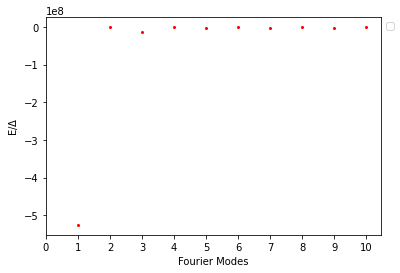

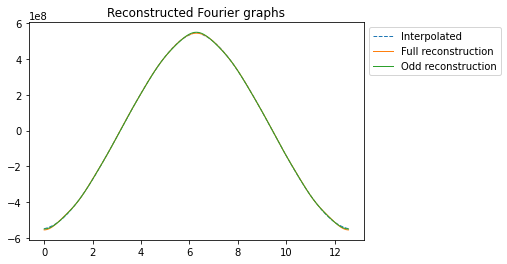

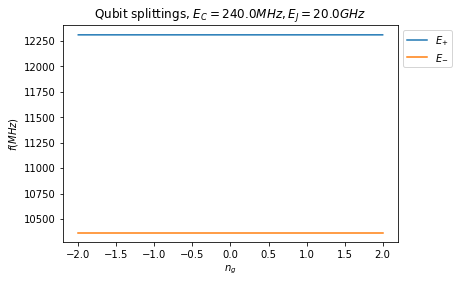

In [5]:
#doing the fourier decomposition

#plotting coefficients
modes=10
delta=0.01
scaled_y=[i/1000*1.6*10**-19/(6.63*10**-34)*delta for i in intery]
print('0.01 meV in Hz:',0.01/1000*1.6*10**-19/(6.63*10**-34)) #is it 0.01 mev? nanowire was 0.182 mev, this should be like 300..
coeffs=f.fourier_decompose(scaled_y,interx,modes=modes,offset=False)
plt.figure()
plt.xlabel('Fourier Modes')
plt.ylabel('E/$\Delta$')
plt.plot(range(1,modes+1),coeffs,'.',color='r',markersize=4)
plt.xticks([0,1,2,3,4,5,6,7,8,9,10])
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.show()

#reconstructing the graph
recon=fourier_reconstruct(scaled_y,interx)
recon_odd=fourier_reconstruct(scaled_y,interx,odd=True)
plt.figure()
plt.plot(interx,scaled_y,'--',linewidth=1,label='Interpolated')
plt.plot(interx,recon,label='Full reconstruction',linewidth=1)
plt.plot(interx,recon_odd,label='Odd reconstruction',linewidth=1)
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.title('Reconstructed Fourier graphs')
plt.show()

#Qubit spectra
levels=50
ng=np.linspace(-2,2,9+8*60)
Ec=240*10**6
Ej=20*10**9
#coeffs=[0]
energies=np.array([f.qubit_energies(Ec,Ej,coeffs,levels,g)/10**6 for g in ng])
plt.figure()
plt.xlabel(r'$n_g$')
plt.ylabel(r'$f(MHz)$')
plt.plot(ng,energies[:,3]-energies[:,0],label='$E_{+}$')
plt.plot(ng,energies[:,2]-energies[:,1],label='$E_{-}$')
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.title(r"Qubit splittings, $E_{C}=%s MHz, E_{J}=%s GHz$"%(Ec/10**6,Ej/10**9))
plt.savefig('3dti_quarterflux_qubit')


# Band spectrum scan, flux 0-1, A_z=0.5, mu=0

In [4]:
fluxarr=np.linspace(0,1,51) #takes pretty long, please dont run this again

params_3DTI=dict(
        A_perp=3,
        A_z=0.5, #changed from kristoffs code
        M_0=0.3,
        M_perp=15,
        M_z=15,
        C_0=0,
        C_perp=0,
        C_z=0
    )
filename='spectrum_sweep_flux'
energy_arr=[]
for flux in fluxarr:
    syst,params_bands=make_3dti(mu=0.,flux=flux,Delta=0.001,params_3DTI=params_3DTI)
    bands=kwant.physics.dispersion.Bands(syst.leads[0],params=params_bands)
    momenta = np.linspace(-.15, .15, 101)
    energies=[bands(k) for k in momenta]
    energy_arr.append(energies)
    pickle.dump(energy_arr,open(filename,'wb'))


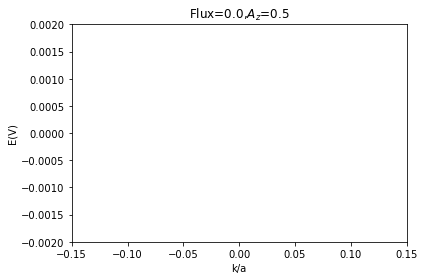

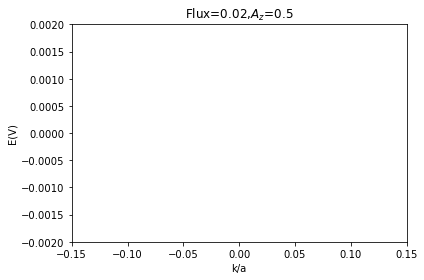

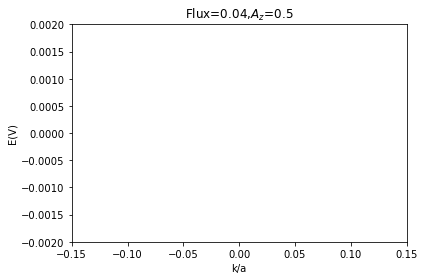

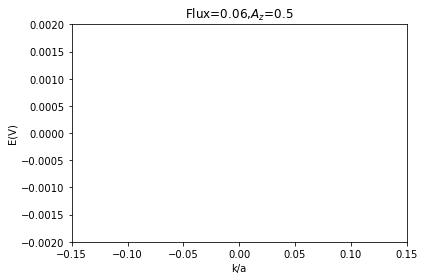

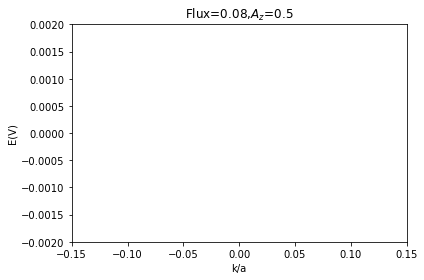

...

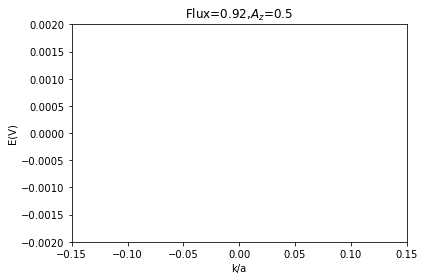

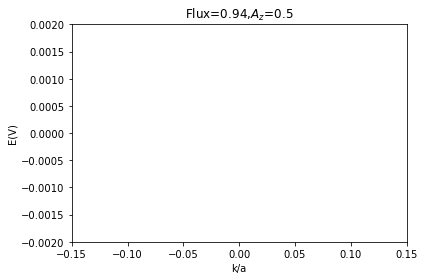

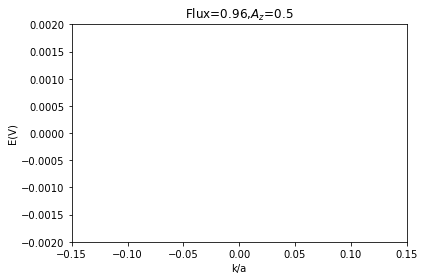

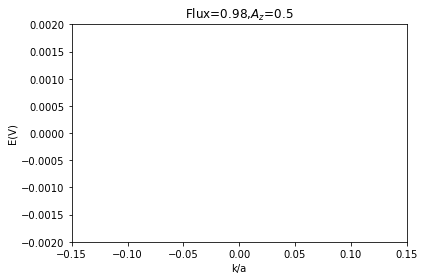

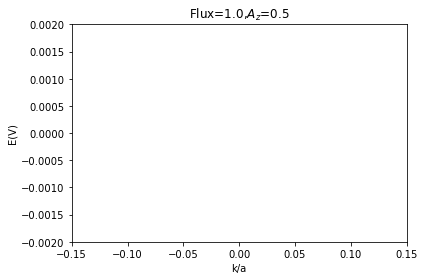

In [16]:
'''filename='spectrum_sweep_flux'
fluxarr=np.linspace(0,1,51)
momenta = np.linspace(-np.pi, np.pi, 101)
energies=pickle.load(open(filename,'rb'))'''
for i in range(len(energy_arr)):
    plt.figure()
    plt.plot(momenta,energies[i])
    plt.xlim(-0.15,0.15)
    plt.ylim(-.002,.002)
    plt.title(r'Flux=%s,$A_{z}$=0.5'%(round(fluxarr[i],3)))
    plt.ylabel('E(V)')
    plt.xlabel('k/a')
    plt.savefig('sweep%i'%(i))
    plt.show()


# Higher res band structure plot to find exact point where band gap closes

In [13]:
#we really just need the origin in momentum space right? Because the dirac cone happens at gamma.
fluxarr=np.linspace(0.5,0.6,201)
fluxarr2=np.linspace(0,5,1001)
params_3DTI=dict(
        A_perp=3,
        A_z=0.5, #changed from kristoffs code
        M_0=0.3,
        M_perp=15,
        M_z=15,
        C_0=0,
        C_perp=0,
        C_z=0
    )
filename='spectrum_sweep_flux_higherresnearD'
energy_arr=[]
for flux in fluxarr:
    syst,params_bands=make_3dti(mu=0.,flux=flux,Delta=0.001,params_3DTI=params_3DTI)
    bands=kwant.physics.dispersion.Bands(syst.leads[0],params=params_bands)
    energies=bands(0)
    energy_arr.append(energies)
    pickle.dump(energy_arr,open(filename,'wb'))
print('Done!')
'''
filename2='spectrum_sweep_flux_0to5'
energy_arr=[]
for flux in fluxarr2:
    syst,params_bands=make_3dti(mu=0.,flux=flux,Delta=0.001,params_3DTI=params_3DTI)
    bands=kwant.physics.dispersion.Bands(syst.leads[0],params=params_bands)
    energies=bands(0)
    energy_arr.append(energies)
    pickle.dump(energy_arr,open(filename2,'wb'))
    '''

Done!


"\nfilename2='spectrum_sweep_flux_0to5'\nenergy_arr=[]\nfor flux in fluxarr2:\n    syst,params_bands=make_3dti(mu=0.,flux=flux,Delta=0.001,params_3DTI=params_3DTI)\n    bands=kwant.physics.dispersion.Bands(syst.leads[0],params=params_bands)\n    energies=bands(0)\n    energy_arr.append(energies)\n    pickle.dump(energy_arr,open(filename2,'wb'))\n    "

In [16]:
filename='spectrum_sweep_flux_higherresnearD'
#filename2='spectrum_sweep_flux_0to5'
fluxarr=np.linspace(0.5,0.6,201)
#fluxarr2=np.linspace(0,5,1001)
en_a=pickle.load(open(filename,'rb'))
#en_a2=pickle.load(open(filename2,'rb'))

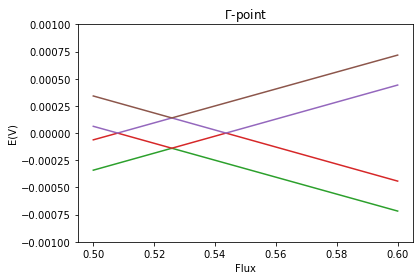

6.223788134621566e-05


In [19]:
plt.figure()
plt.plot(fluxarr,en_a)
plt.title(r'$\Gamma$-point ')
plt.ylabel('E(V)')
plt.xlabel('Flux')
plt.ylim(-0.001,0.001)
plt.show()
print(en_a[0][int(len(en_a[0])/2)]) #the gap causes reflection about 0, so by right we should have a dirac cone at 0.53

# Finding where only 1 band is crossed in the leads for topological phase

In [21]:
import matplotlib as mpl
import matplotlib.pyplot as plt

fluxs=np.linspace(0,1,51)
Vdata = []
params_3DTI=dict(
                A_perp=3,
                A_z=0.5, #changed from kristoffs code
                M_0=0.3,
                M_perp=15,
                M_z=15,
                C_0=0,
                C_perp=0,
                C_z=0
            )
energies = np.linspace(-0.005,0.005,51)
for e in energies:
    E_data=[]
    for flux in fluxs:
        syst,params_bands=make_3dti(mu=0.,flux=flux,Delta=0.001,params_3DTI=params_3DTI)
        plt.rcParams["figure.figsize"]= (8,5)  
        mode_info = syst.leads[0].modes(energy=e, params=params_bands)
        E_data.append((mode_info[0].block_nmodes[0]))  
            
    Vdata.append(E_data)


NameError: name 'Bfields' is not defined

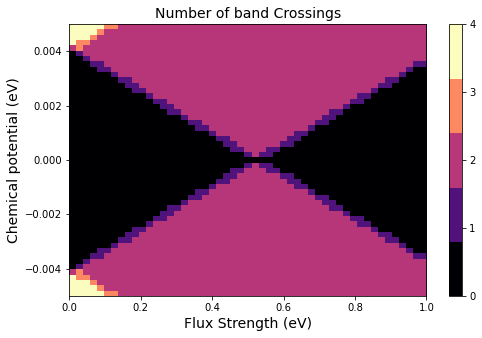

In [22]:
filename='3dti_crossings_plot'
pickle.dump(Vdata,open(filename,'wb'))
cbar = mpl.cm.get_cmap("magma", 5)
            
plt.imshow(Vdata, aspect = 'auto',extent = [min(fluxs), max(fluxs), min(energies), max(energies)], cmap=cbar)
plt.xlabel("Flux Strength (eV)", fontsize=14)
#cbar.set_label("no of band crossings")
plt.ylabel("Chemical potential (eV)", fontsize=14)
plt.colorbar(ticks=np.linspace(0,4,5))
plt.title('Number of band Crossings', fontsize=14 )
plt.show() #this was for with delta. Without delta will be different!!!

# Flux rescaling as function of A_z

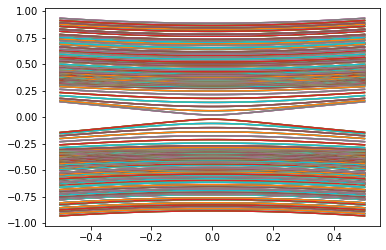

In [18]:
params_3DTI=dict(A_perp=3,A_z=3,M_0=0.3,M_perp=15,M_z=15,C_0=0,C_perp=0,C_z=0)
systf,band_params=make_3dti(Lx=100,Wy=100,Tz=100,a=10,phase=0,mu=0.0,flux=0,Delta=0.001,params_3DTI=params_3DTI)
bands=kwant.physics.dispersion.Bands(systf.leads[0],params=band_params)
momenta=np.linspace(-0.5,0.5,121)
energies=[bands(k) for k in momenta]
plt.plot(momenta,energies)
plt.show()


(121, 968)


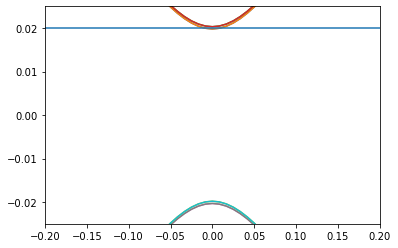

In [46]:
plt.figure()
plt.plot(momenta,np.array(energies)[:,484-10:484+10])
plt.xlim(-.2,.2)
plt.ylim(-.025,.025)
plt.axhline(0.02) #eh? why isnt 0.02 within a band now? oh, it is
print(np.array(energies).shape)

In [2]:
Az_arr=np.linspace(0.3,4.3,51)
saved_bands=10 #reduce memory req
filename='Az_anisotropy_bandplot'
save=[]
for A_z in Az_arr:
    params_3DTI=dict(A_perp=3,A_z=A_z,M_0=0.3,M_perp=15,M_z=15,C_0=0,C_perp=0,C_z=0)
    systf,band_params=make_3dti(Lx=100,Wy=100,Tz=100,a=10,phase=0,mu=0.0,flux=0,Delta=0.0,params_3DTI=params_3DTI)
    bands=kwant.physics.dispersion.Bands(systf.leads[0],params=band_params)
    momenta=np.linspace(-0.5,0.5,121)
    energies=np.array([bands(k) for k in momenta])
    index=int(energies.shape[1]/2)
    saved_en=energies[:,index-saved_bands:index+saved_bands]
    save.append(saved_en)
    pickle.dump(save,open(filename,'wb'))


C:\Users\hht18\AppData\Local\Temp\ipykernel_920\3705067528.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
C:\Users\hht18\AppData\Local\Temp\ipykernel_920\3705067528.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
C:\Users\hht18\AppData\Local\Temp\ipykernel_920\3705067528.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcPa

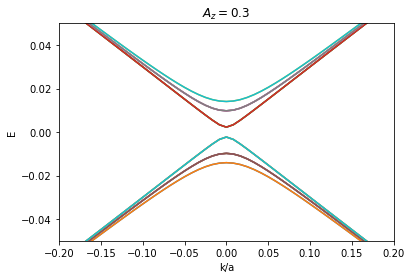

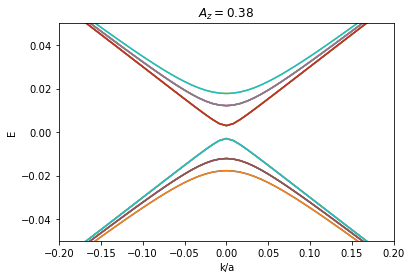

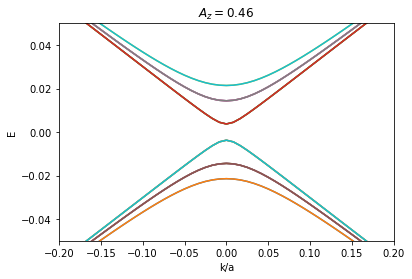

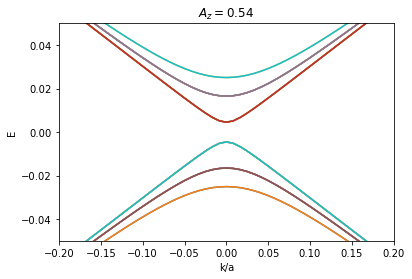

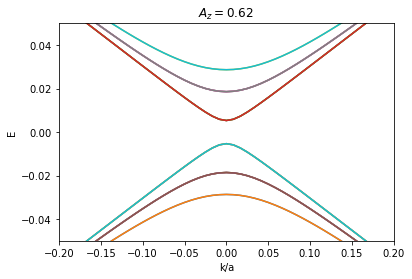

...

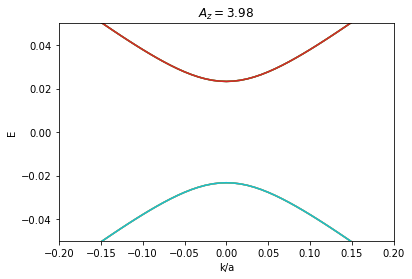

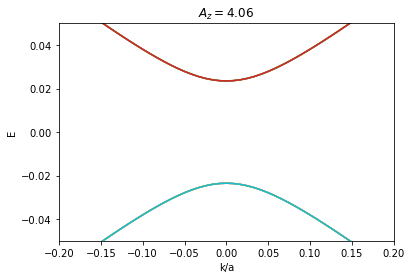

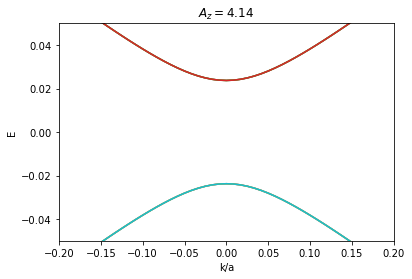

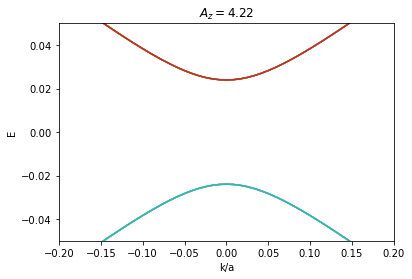

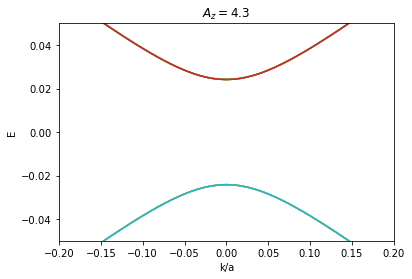

In [21]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
filename='Az_anisotropy_bandplot'
data=pickle.load(open(filename,'rb'))
for i in range(len(Az_arr)):
    az=Az_arr[i]
    plt.figure()
    ylim=0.05
    xlim=0.2
    plt.plot(momenta,data[i])
    plt.xlabel('k/a')
    plt.ylabel('E')
    plt.xlim(-xlim,xlim)
    plt.ylim(-ylim,ylim)
    plt.savefig('anisotropy%s'%(i))
    plt.title(r'$A_z=%s$'%(round(Az_arr[i],3)))


[array([-0.03001352,  0.        ,  0.03001352]),
 array([-0.02998352,  0.        ,  0.02998352]),
 array([-0.02989773,  0.        ,  0.02989773]),
 array([-0.02976746,  0.        ,  0.02976746]),
 array([-0.02960808,  0.        ,  0.02960808]),
 array([-0.02943566,  0.        ,  0.02943566]),
 array([-0.02926448,  0.        ,  0.02926448]),
 array([-0.02910559,  0.        ,  0.02910559]),
 array([-0.02896627,  0.        ,  0.02896627]),
 array([-0.0288502,  0.       ,  0.0288502]),
 array([-0.0287581,  0.       ,  0.0287581]),
 array([-0.02868853,  0.        ,  0.02868853]),
 array([-0.02863888,  0.        ,  0.02863888]),
 array([-0.02860616,  0.        ,  0.02860616]),
 array([-0.02858773,  0.        ,  0.02858773]),
 array([-0.02858179,  0.        ,  0.02858179]),
 array([-0.02858773,  0.        ,  0.02858773]),
 array([-0.02860616,  0.        ,  0.02860616]),
 array([-0.02863888,  0.        ,  0.02863888]),
 array([-0.02868853,  0.        ,  0.02868853]),
 array([-0.0287581,  0.   

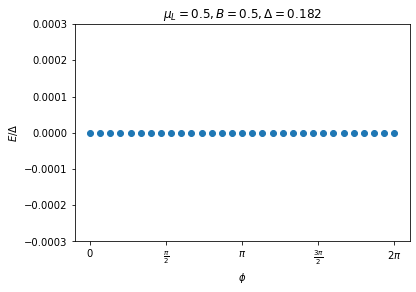

In [22]:
filename='SNTS_Keselman'
data=pickle.load(open(filename,'rb'))

def arrange_E(E_arr,phi_arr):
    '''
    Takes the output from boundstate algorithm and the scanned phases
    and arranges them into a single list for plotting.
    '''
    new_y=[]
    new_x=[]
    for i in range(len(phi_arr)):
        for j in range(len(E_arr[i])):
            new_x.append(phi_arr[i])
            new_y.append(E_arr[i][j])
    
    return new_x,new_y
phi_arr=np.linspace(0,2*np.pi,31)
x,y=arrange_E(data,phi_arr)
y=[i/.182 for i in y]

plt.figure
plt.scatter(x,y)
plt.title(r'$\mu_{L}=0.5,B=0.5,\Delta=0.182$')
plt.xticks(np.linspace(0,2*np.pi,5,endpoint=True), ['0',r'$\frac{\pi}{2}$',r'$\pi$',
                                                     r'$\frac{3\pi}{2}$',r'$2\pi$'])
plt.xlabel('$\phi$')
plt.ylabel('$E/\Delta$')
plt.savefig('snts')

plt.ylim(-0.0003,0.0003)
plt.savefig('snts_0')
data

C:\Users\hht18\AppData\Local\Temp\ipykernel_12508\3444603399.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
C:\Users\hht18\AppData\Local\Temp\ipykernel_12508\3444603399.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
C:\Users\hht18\AppData\Local\Temp\ipykernel_12508\3444603399.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see

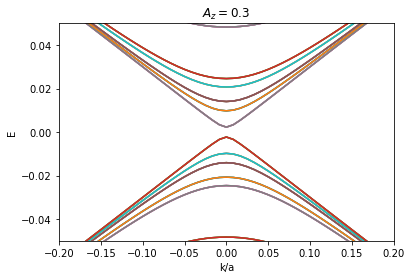

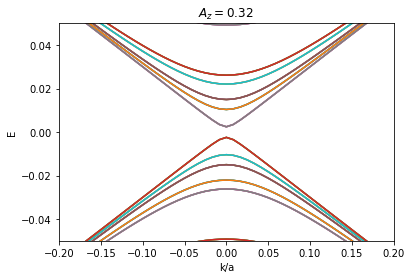

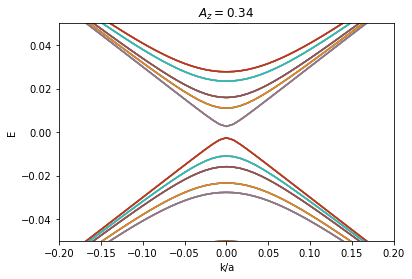

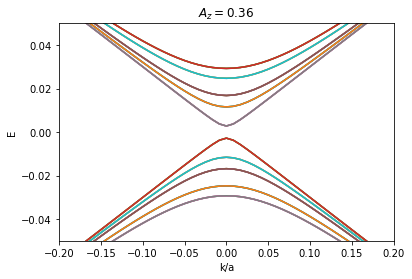

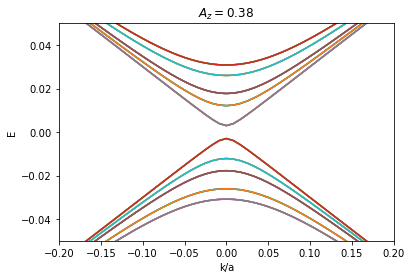

...

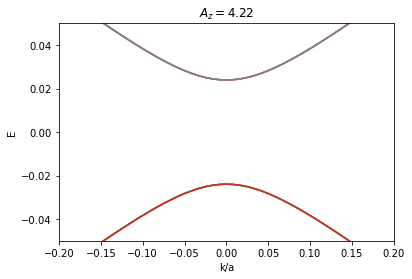

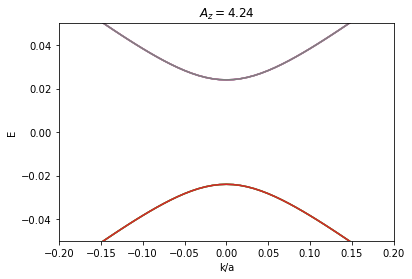

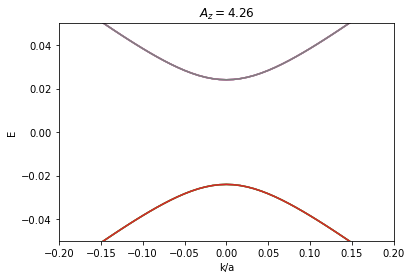

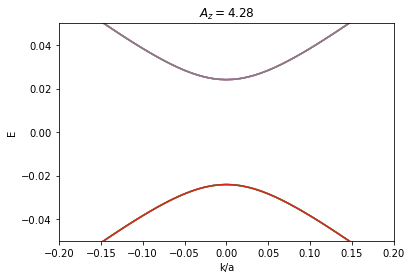

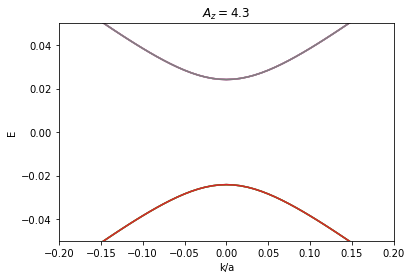

In [3]:
''' Parameters for the Az changing file bandplot
mu = 0.
Delta = 0.
phi = 0.
flux=0.

Az_arr=np.linspace(0.3,4.3,201)
energy_arr=[]

filename='3dti_highresbandplot_changeAz'
for A_z in Az_arr:
    energies=[]
    params_bands.update(
        mu = mu,
        B_x = flux/W_y/T_z,
        Deltaf_L = lambda y, z: Delta if z==T_z else 0,
        Deltaf_R = lambda y, z: Delta*np.exp(1j*phi) if z==T_z else 0,
        A_z=A_z)
    
    bands=kwant.physics.dispersion.Bands(fsyst.leads[0],params=params_bands)
    momenta=np.linspace(-0.5,0.5,121)
    energies=np.array([bands(k) for k in momenta])
    energy_arr.append(energies)
    pickle.dump(energy_arr,open(filename,'wb'))
'''

momenta=np.linspace(-0.5,0.5,121)
filename='3dti_highresbandplot_changeAz'
data=pickle.load(open(filename,'rb'))
Az_arr=np.linspace(0.3,4.3,201)
for i in range(len(Az_arr)):
    az=Az_arr[i]
    plt.figure()
    ylim=0.05
    xlim=0.2
    plt.plot(momenta,data[i])
    plt.xlabel('k/a')
    plt.ylabel('E')
    plt.xlim(-xlim,xlim)
    plt.ylim(-ylim,ylim)
    plt.savefig('anisotropy%s'%(i))
    plt.title(r'$A_z=%s$'%(round(Az_arr[i],3)))


# Chenlu, half flux plot

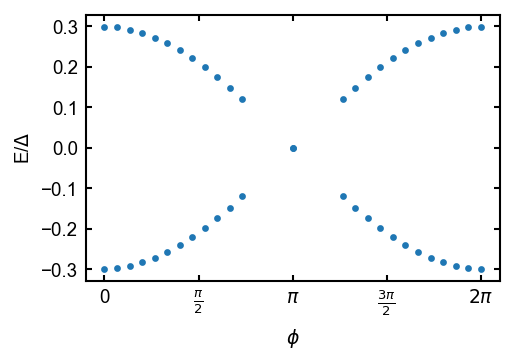

In [6]:
'''
mu = 0.02
Delta = 0.001

flux=0.5
phi_arr=np.linspace(0,2*np.pi,31)
arr_ind=int(os.environ['PBS_ARRAY_INDEX'])
jobs=16
perjob=2
filename='3dti_energy_phase_230122_halfflux'
fluxarr=[]
fluxwaves=[]
counter=0
for i in range(len(phi_arr)):
    counter+=1
    if (counter <= (arr_ind+1)*perjob) and (counter>(arr_ind*perjob)):
        params_bands.update(
            mu = mu,
            B_x = flux/W_y/T_z,
            Deltaf_L = lambda y, z: Delta if z==T_z else 0,
            Deltaf_R = lambda y, z: Delta*np.exp(1j*phi_arr[i]) if z==T_z else 0)
        energy,waves=bs.find_boundstates(fsyst,-Delta,Delta,rtol=Delta/30,params=params_bands)
        fluxarr.append(energy)
        fluxwaves.append(waves)
        combine=[i,fluxarr,fluxwaves]
        pickle.dump(combine,open(filename+'%s'%(i),'wb'))
    

'''

'''
filename2='3dti_energy_phase_230122_halfflux'
energy_arr2,wavefuncs2=pickle.load(open(filename2,'rb'))
print(len(energy_arr2))

phi_arr=np.linspace(0,2*np.pi,31)
x,y=f.arrange_E(energy_arr2,phi_arr)
y=[i/0.01 for i in y]
plt.figure()
plot_ephase(x,y,pi=2)
plt.title(r'Half Flux 3DTI 11x11x11 E-$\phi$')
#plt.savefig('3dti-halfflux-250122')
index_list=[]
for i in range(len(energy_arr2)):
    if energy_arr2[i].size!=0:
        index_list.append(i)
index_list
'''

plt.style.use('genstyle.mplstyle')
en_arr=[]
for i in range(31):
    filename='./3dti_data_feb27/3dti_energy_phase_230122_halfflux%s'%(i)
    i,en,wave=pickle.load(open(filename,'rb'))
    if len(en)==1:
        en_arr.append(en[0])
    else:
        en_arr.append(en[1])

phi_arr=np.linspace(0,2*np.pi,31)
x,y=f.arrange_E(en_arr,phi_arr)
y=[i/.001 for i in y]
plt.figure()
plot_ephase(x,y,2)
plt.savefig('3DTI_half_flux_chenlustyleplot.png')

In [7]:
from qutip import *
def qubit_energies(Ec,Ej,charge_arr,N,ng,eigvals=4):
    """
    Plot energy levels as a function of bias parameter B_vec.
    """
    energies =general_hamiltonian(Ec, Ej, N, ng,charge_arr).eigenenergies(eigvals=eigvals)
    energies=np.array(np.real(energies))
    return energies

def general_hamiltonian(Ec,Ej,N,ng,charge_arr):
    '''
    Ec,Ej,ng as per usual
    N is no. of levels to consider
    charge_arr is list of Fourier coefficients for cos(i*phi/2) WITHOUT OFFSET
    '''
    if N<len(charge_arr):
        raise Exception('Considering %s charge transfer but only %s levels'%(
                        len(charge_arr),N))
    m = np.diag(Ec * (np.arange(-N,N+1)-ng)**2)
    m+= 0.5 * Ej * (np.diag(-np.ones(2*N-1), 2) +  np.diag(-np.ones(2*N-1), -2))
    for i in range(len(charge_arr)):
        amp=charge_arr[i]
        term=np.diag(np.ones(2*N-i), i+1)
        hc=np.diag(np.ones(2*N-i), -(i+1))      
        m+=0.5*amp*(term + hc)
    
    return Qobj(m)

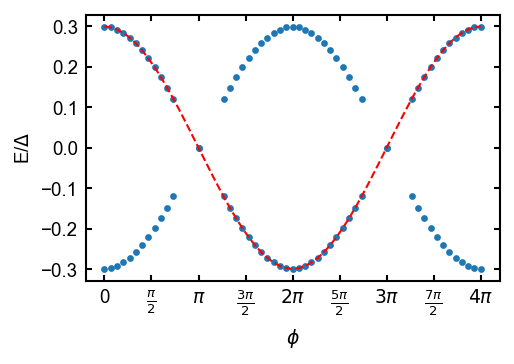

1 meV in GHz: 241.32730015082956


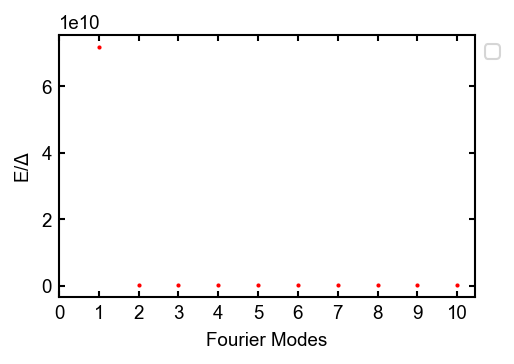

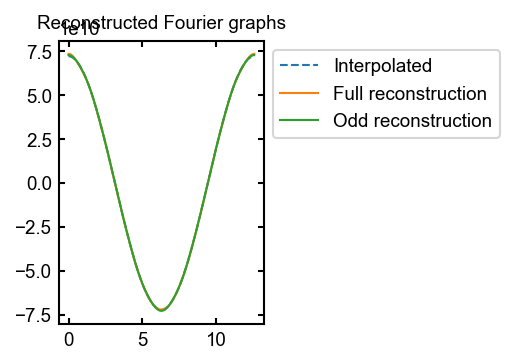

Text(0.5, 1.0, 'Qubit splittings, $E_{C}=240.0 MHz, E_{J}=0.24 GHz$')

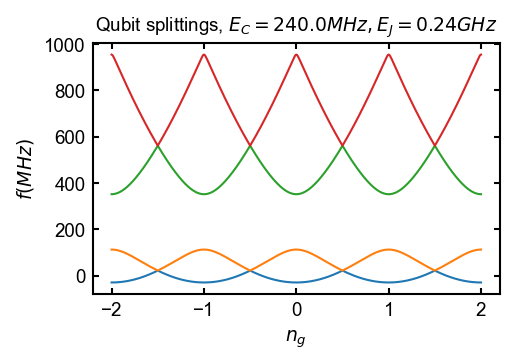

In [12]:
plt.style.use('genstyle.mplstyle')
parr,pphi=f.process_data(en_arr,phi_arr,fill=True,extend=True,single=True)
delta=0.001
index=1
branch,phi=f.gradient_addition(index,parr,pphi,printing=False) 
interx,intery=f.interpolate(branch,phi)
plt.figure()

x,y=f.arrange_E(parr,pphi)
intery=[i/delta for i in intery]
y=[i/delta for i in y]
plt.plot(interx,intery,'--',label='Interpolated data',color='r')
plot_ephase(x,y,pi=4)
#plt.title(r'0.25 Flux 3DTI 11x11x11 E-$\phi$')
#plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.savefig('Chenlu_half_flux_interpolated.png')
plt.show()

#doing the fourier decomposition

#plotting coefficients
modes=10
scaled_y=[i*delta*1.6*10**-19/(6.63*10**-34) for i in intery]
print('1 meV in GHz:',1/1000*1.6*10**15/(6.63)/1e9) #is it 0.01 mev? nanowire was 0.182 mev, this should be like 300..
coeffs=f.fourier_decompose(scaled_y,interx,modes=modes,offset=False)
plt.figure()
plt.xlabel('Fourier Modes')
plt.ylabel('E/$\Delta$')
plt.plot(range(1,modes+1),coeffs,'.',color='r',markersize=4)
plt.xticks([0,1,2,3,4,5,6,7,8,9,10])
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.show()

#reconstructing the graph
recon=fourier_reconstruct(scaled_y,interx)
recon_odd=fourier_reconstruct(scaled_y,interx,odd=True)
plt.figure()
plt.plot(interx,scaled_y,'--',linewidth=1,label='Interpolated')
plt.plot(interx,recon,label='Full reconstruction',linewidth=1)
plt.plot(interx,recon_odd,label='Odd reconstruction',linewidth=1)
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.title('Reconstructed Fourier graphs')
plt.show()

#Qubit spectra
levels=50
ng=np.linspace(-2,2,9+8*60)
Ec=240*10**6
Ej=20*10**9
Ej=Ec
coeffs=[0]
energies=np.array([qubit_energies(Ec,Ej,coeffs,levels,g)/10**6 for g in ng])
plt.figure()
plt.xlabel(r'$n_g$')
plt.ylabel(r'$f(MHz)$')
plt.plot(ng,energies)
#plt.plot(ng,energies[:,3]-energies[:,0],label='$E_{+}$')
#plt.plot(ng,energies[:,2]-energies[:,1],label='$E_{-}$')
#plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.title(r"Qubit splittings, $E_{C}=%s MHz, E_{J}=%s GHz$"%(Ec/10**6,Ej/10**9))
#plt.savefig('chenlu_3dti_halfflux_qubit')

In [96]:
(energies[0,:][3]-energies[0,:][0])/np.sqrt(8.*Ec*Ej)*1e6

1.7834951295536985

In [86]:
(energies[0,:][3]-energies[0,:][0])-(energies[0,:][2]-energies[0,:][1])

16550.347044142887

In [75]:
6084.56/11469.03

0.530520889735226